In [1]:
%autosave 60

Autosaving every 60 seconds


# Домашнее задание №2
**Блок ML**. Тема: Реализация ансамблевых методов с оценкой неопределенности.

В этом ноутбуке реализован стекинг для задачи регрессии из соревнования. В качестве базовых моделей используются пять разных алгоритмов: Linear Regression, Random Forest, XGBoost, LightGBM и CatBoost.

Для обучения базовых моделей применяется Stratified K-Fold с 5 фолдами. На каждом фолде получаются out-of-fold предсказания для обучающей выборки и предсказания для test. OOF-предсказания базовых моделей затем используются как признаки для мета-модели. В качестве мета-модели используется CatBoostRegressor.

В финальном блоке рассчитывается неопределенность предсказаний:

- эпистемическая неопределенность – разброс предсказаний моделей;
- алеаторная неопределенность – ошибка предсказания относительно истинного таргета;
- общая неопределенность – сумма эпистемической и алеаторной компонент.

Для оценки качества моделей используется MSE. Есть графики и таблицы, которые показывают распределение неопределенности, связь неопределенности с фактической ошибкой и различия между базовыми моделями и итоговым стекингом.


### Содержание

- Data EDA
  - Сравнение распределений признаков в train и test выборках
  - Проверка пропусков в данных
  - Таргет; даты, числовые, категориальные, id и гео признаки
- Data preprocessing
  - Target binning for stratification
  - Features
    - Feature engineering
    - Feature selection
      - Stratified test/valid split для feature importance
      - Adversarial Validation Score
      - Feature Importance
      - Permutation Importance
      - SHAP
- Utils (универсальная функция для обучения моделей и сбора данных для расчета эпистемической неопределенности)
- Models
  - Model fit (1) – Baseline training
  - Hyperparameters tuning
  - Model fit (2) – Final model training
- Ensemble / Stacking (CatBoost meta-model)
- Uncertainty
  - Эпистемическая неопределенность
  - Алеаторная неопределенность
  - Зависимость неопределенности от таргета
  - Сумма неопределенностей (эпистемическая + алеаторная)
  - Метрики алеаторной, эпистемической и общей неопределенности

In [2]:
import math
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

from IPython.display import display, Markdown

from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
from sklearn.metrics import mean_squared_error

from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor

#### Graphics settings

In [3]:
plt.style.use('seaborn-v0_8-whitegrid')
plt.style.use('utils/stacking_uncertainty.mplstyle')

%config InlineBackend.figure_format = 'retina'

box = "#20BDB8"
dimred = "#D31111"
textcolor = "#333333"


# Data EDA

### Data load

In [4]:
df_train = pd.read_csv('data/train.csv')
df_test = pd.read_csv('data/test.csv')

df_train_original = df_train.copy()
df_test_original = df_test.copy()

In [5]:
df_train.head(5)

,name,_id,host_name,location_cluster,location,lat,lon,type_house,sum,min_days,amt_reviews,last_dt,avg_reviews,total_host,target
0,Belle Harbor 4 BR 2 bath- 1 bl from Beach,40327248,Sarina,Queens,Neponsit,40.57215,-73.85822,Entire home/apt,350,2,5,2019-07-07,2.88,1,334
1,"Come see Brooklyn, New York",13617520,Howard T.,Brooklyn,Clinton Hill,40.69172,-73.96934,Shared room,40,5,8,2015-02-25,0.13,1,0
2,Large 2Br on W71st & Columbus Feb 19-28,26754726,Julie,Manhattan,Upper West Side,40.77673,-73.98011,Entire home/apt,200,5,0,NaN,NaN,1,0
3,Perfect bedroom. Near Subways Columbia CityCol...,16721721,Federico,Manhattan,Harlem,40.81530,-73.95080,Private room,65,2,18,2018-11-04,0.64,1,0
4,Cozy Sun Filled Fresh Guest Room in Artsy Bush...,22246463,Lisa,Brooklyn,Bushwick,40.70230,-73.92935,Private room,99,2,26,2019-06-23,0.76,1,155


In [6]:
df_test.head(2)

,name,_id,host_name,location_cluster,location,lat,lon,type_house,sum,min_days,amt_reviews,last_dt,avg_reviews,total_host
0,Amazing 4 Bedrooms 4 Bathrooms sleeps 9,199147185,Lou,Brooklyn,Sunset Park,40.66468,-73.99785,Entire home/apt,399,1,0,NaN,NaN,5
1,Super Spacious room in Brooklyn,259427246,Nelly,Brooklyn,Bedford-Stuyvesant,40.67880,-73.92722,Private room,43,1,4,2019-06-10,2.0,3


In [7]:
df_train.describe()

,_id,lat,lon,sum,min_days,amt_reviews,avg_reviews,total_host,target
count,3.667100e+04,36671.000000,36671.000000,36671.000000,36671.000000,36671.000000,29169.000000,36671.000000,36671.000000
mean,6.720433e+07,40.729080,-73.951958,152.142292,7.053176,23.433667,1.365601,7.047694,112.766628
std,7.828147e+07,0.054671,0.046201,239.107973,21.539569,44.703590,1.643966,32.595427,131.583284
min,2.438000e+03,40.499790,-74.244420,0.000000,1.000000,0.000000,0.010000,1.000000,0.000000
25%,7.780024e+06,40.690090,-73.982970,69.000000,1.000000,1.000000,0.190000,1.000000,0.000000
50%,3.053256e+07,40.723150,-73.955560,106.000000,3.000000,5.000000,0.720000,1.000000,45.000000
75%,1.074344e+08,40.763260,-73.935865,175.000000,5.000000,24.000000,2.010000,2.000000,227.000000
max,2.743213e+08,40.912340,-73.712990,10000.000000,1250.000000,629.000000,20.940000,327.000000,365.000000


### EDA

##### Сравнение распределений признаков в train и test выборках

In [8]:
# таблица для попарного сравнения характеристик train и test
percentiles = [0.01, 0.5, 0.95, 0.99]

train_desc = df_train.describe(percentiles=percentiles)
test_desc = df_test.describe(percentiles=percentiles)

rows = []

for stat in train_desc.index:
    # train строка
    row_train = train_desc.loc[stat].copy()
    row_train.name = f"train_{stat}"
    rows.append(row_train)
    
    # test строка
    row_test = test_desc.loc[stat].copy()
    row_test.name = f"test_{stat}"
    rows.append(row_test)

display(pd.DataFrame(rows))

,_id,lat,lon,sum,min_days,amt_reviews,avg_reviews,total_host,target
train_count,3.667100e+04,36671.000000,36671.000000,36671.000000,36671.000000,36671.000000,29169.000000,36671.000000,36671.000000
test_count,1.222400e+04,12224.000000,12224.000000,12224.000000,12224.000000,12224.000000,9674.000000,12224.000000,NaN
train_mean,6.720433e+07,40.729080,-73.951958,152.142292,7.053176,23.433667,1.365601,7.047694,112.766628
test_mean,6.886703e+07,40.728555,-73.952806,154.455825,6.960324,22.796875,1.396199,7.432837,NaN
train_std,7.828147e+07,0.054671,0.046201,239.107973,21.539569,44.703590,1.643966,32.595427,131.583284
test_std,7.958145e+07,0.054105,0.046020,243.267298,17.055669,44.086754,1.785811,34.001000,NaN
train_min,2.438000e+03,40.499790,-74.244420,0.000000,1.000000,0.000000,0.010000,1.000000,0.000000
test_min,2.787000e+03,40.506410,-74.239140,0.000000,1.000000,0.000000,0.010000,1.000000,NaN
train_1%,1.041630e+05,40.596763,-74.026190,30.000000,1.000000,0.000000,0.020000,1.000000,0.000000
test_1%,8.869361e+04,40.596275,-74.027591,30.000000,1.000000,0.000000,0.020000,1.000000,NaN


Распределения числовых признаков в train и test в целом похожи по центральной части распределенения до 95-99%. Но есть необычные значения в хвостах распределений:

- `sum`: 99% = 760/800, но max=~10000. Похоже на заглушку "жилье не сдается". Можно рассмотреть сделать клиппинг по 99% от значения в train.
- `min_days`: 99% = 45 в обеих выборках, но max (train) = 1250 при max (test) = 365. Модель будет обучаться на признаках, которых нет в тестовых данных.
- `avg_reviews` (среднее количество отзывов за период ?): максимальные значения train ~21, test ~58.5, то есть в тестовых данных есть такие значения, которых нет в обучающей выборке.
- `amt_reviews`: очень длинный хвост распределения, 99% = ~211-214, при максимуме 629/607 и при медианном значении ~5 в обеих выборках.
- `total_host`: медиана ~1, при этом максимальное значение 327. В совокупности с перекосом в amt_reviews можно предположить, что это гостиницы или бизнес-аккаунты. Можно сделать для таких хостов отдельную категорию.
- `target`: 99%=365 и max=365, это ceiling значение.

In [9]:
target = df_train['target']      # количество дней, когда жилье было занято за год

cat_cols = [
    'location_cluster',  # кластер местоположения
    'location',          # описание местоположения объекта
    'type_house'         # тип жилья
]

num_cols = [
    'sum',               # (price per night)? общая стоимость аренды или сумма за определенный период.
    'min_days',          # минимальное количество дней для бронирования объекта.
    'amt_reviews',       # количество отзывов, оставленных для данного объекта.
    'avg_reviews',       # средний рейтинг или среднее количество отзывов за определенный период.
    'total_host'         # общее количество объектов, принадлежащих одному хосту
]

date_cols = [
    'last_dt'            # дата последнего отзыва или последнего бронирования.
]

id_cols = [
    '_id',               # уникальный идентификатор
    'name',              # название объекта
    'host_name'          # имя владельца или хоста, который предоставляет жилье
]

geo_cols = [
    'lat',               # широта и долгота местоположения объекта.
    'lon'
]

##### Проверка пропусков в данных

In [10]:
# признаки с пропусками - train
df_train.isna().sum()[df_train.isna().sum() > 0].sort_values(ascending=False)

last_dt        7502
avg_reviews    7502
host_name        18
name              9
dtype: int64

In [11]:
# признаки с пропусками - test
df_test.isna().sum()[df_test.isna().sum() > 0].sort_values(ascending=False)

last_dt        2550
avg_reviews    2550
name              7
host_name         3
dtype: int64

In [12]:
# совпадают ли пропуски в avg_reviews и last_dt в train?
print("Пропуски в avg_reviews и last_dt совпадают в train:",
      (df_train['avg_reviews'].isna() == df_train['last_dt'].isna()).all())

display(pd.crosstab(
    df_train['last_dt'].isna(),
    df_train['avg_reviews'].isna()
))

# в test
print("Пропуски в avg_reviews и last_dt совпадают в test:",
      (df_test['avg_reviews'].isna() == df_test['last_dt'].isna()).all())

display(pd.crosstab(
    df_test['last_dt'].isna(),
    df_test['avg_reviews'].isna()
))

Пропуски в avg_reviews и last_dt совпадают в train: True


avg_reviews,False,True
last_dt,,
False,29169,0
True,0,7502


Пропуски в avg_reviews и last_dt совпадают в test: True


avg_reviews,False,True
last_dt,,
False,9674,0
True,0,2550


- Пропуски в 'avg_reviews' и 'last_dt' полностью совпадают, значит у ряда объектов нет отзывов и, соответственно, даты последнего отзыва. 
- временной признак 'last_dt' можно преобразовать в числовой признак 'days_since_last_review'.

---

#### Таргет

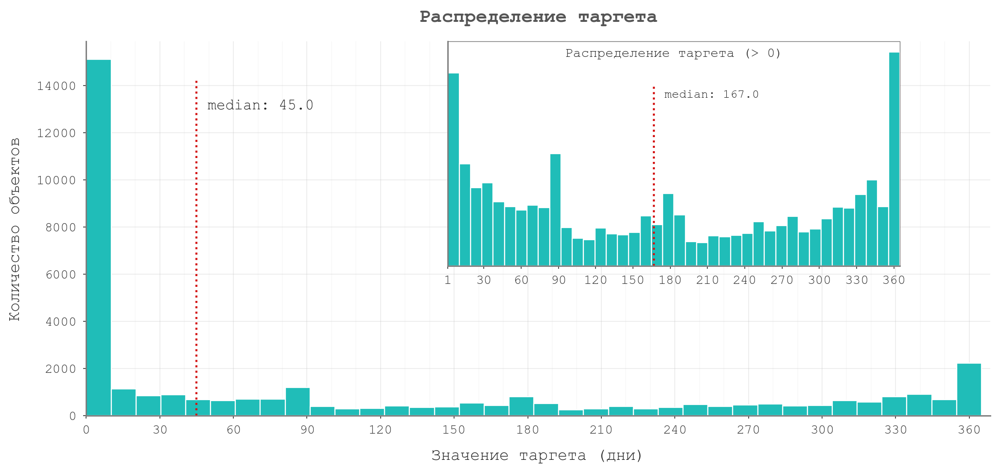

In [13]:
fig, ax = plt.subplots(figsize=(12, 5))

# гистограмма
df_train['target'].hist(bins=36, ax=ax, color=box, edgecolor='white')

# медиана
median = df_train['target'].median()
ax.axvline(median, color=dimred, linestyle=':', lw=1.5, ymax=0.9,)
ax.text(median*1.1, 13000, f'median: {median}')

# тики
ax.set_xticks(np.arange(0, 366, 30))
ax.set_xticks(np.arange(0, 366, 10), minor=True)
ax.grid(which='major', axis='x', alpha=0.3)
ax.grid(which='minor', axis='x', alpha=0.1)

# настройки гистограммы
ax.set_xlim(0, df_train['target'].max()*1.01)
ax.set_title("Распределение таргета")
ax.set_xlabel("Значение таргета (дни)")
ax.set_ylabel("Количество объектов")

# ZOOM: распределение без нулей

axins = ax.inset_axes([0.40, 0.40, 0.5, 0.6])

target_nozeros = df_train['target'][df_train['target'] > 0]

target_nozeros.hist(bins=40, ax=axins, color=box, edgecolor='white')

# zoom: медиана
median_z = target_nozeros.median()
axins.axvline(median_z, color=dimred, linestyle=':', lw=1.5, ymax=0.8,)
axins.text(median_z*1.05, axins.get_ylim()[1]*0.75, f'median: {median_z}', fontsize=9)

# zoom: настройки области
axins.text(0.5, 0.97,
    f"Распределение таргета (> 0)",
    transform=axins.transAxes,
    ha='center', va='top', fontsize=10)

axins.set_xlim(1, 365) 
axins.set_xticks(np.insert(np.arange(30, 366, 30), 0, 1))

axins.set_yticks([])
axins.grid(False)

axins.patch.set_facecolor('white')
axins.patch.set_alpha(1)
axins.patch.set_edgecolor("#777777")
axins.patch.set_linewidth(0.5)
    
plt.show()

Распределение таргета сильно асимметричное с большим количеством нулевых значений, которые тянут медиану влево (median 45). Есть так же отдельный заметный кластер значений, близких к максимальному (365 дней). 
Возможно много нулевых значений – это новые объекты в базе, или которые по какой-то причине не сдаются большую часть года (например доступны только когда сами хозяева выезжают из этого жилья на каникулы). 

При этом центральная часть распределения (без учета объектов c нулевым значением таргета) выглядит более равномерной в широком диапазоне, медиана в этой части (median 167) заметно выше, то есть наличие большого количества нулей существенно смещает медиану всего распределения. 

Возможно на таргет влияют две разные ситуации – часть жилья доступна для аренды в нормальном режиме, и другая часть – только временно или по факту не доступна, хотя и значится в базе.

**Может ли модель классифицировать объекты с нулевым таргетом?**

In [14]:
df_train['is_zero_days'] = (df_train['target'] == 0).astype(int)

In [15]:
from catboost import CatBoostClassifier

features = geo_cols + cat_cols + num_cols 
cat_features = cat_cols 

# кросс-валидация
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# CatBoostClassifier, так как есть категориальные признаки
model = CatBoostClassifier(
    depth=5,
    verbose=0,
    random_state=42
)

# обучение модели
model.fit(
    df_train[features],
    df_train['is_zero_days'],
    cat_features=cat_cols
)

# расчет ROC AUC
score = cross_val_score(
    model,
    df_train[features],
    df_train['is_zero_days'],
    cv=cv,
    params={'cat_features': cat_cols},
    scoring='roc_auc',
).mean()

print(f"ROC AUC: {score.round(3)}")
model.get_feature_importance(prettified=True)


ROC AUC: 0.883


,Feature Id,Importances
0,avg_reviews,29.566781
1,total_host,17.469747
2,min_days,11.768565
3,sum,10.884047
4,amt_reviews,8.764246
5,lon,6.208702
6,lat,5.548357
7,location,4.753757
8,type_house,3.315392
9,location_cluster,1.720406


**ROC AUC: 0.883**: вероятность того, что модель присвоит более высокий скор объекту с is_zero_days = 1, чем объекту с is_zero_days = 0, составляет около 88%. Это хороший результат.

Топ-3 признака (avg_reviews, total_host, min_days) дают 60% importance и являются ключевыми для разделения. Наименее значимые признаки: location, type_house, location_cluster.

---

#### Даты

In [16]:
# преобразование last_dt в datetime с обработкой ошибок
df_train['last_dt'] = pd.to_datetime(df_train['last_dt'], errors='coerce')
df_test['last_dt'] = pd.to_datetime(df_test['last_dt'], errors='coerce')

In [17]:
# дата самого последнего отзыва
max_date = df_train['last_dt'].max()

# новый признак для давности последнего отзыва
df_train['days_since_last_review'] = (max_date - df_train['last_dt']).dt.days
df_test['days_since_last_review'] = (max_date - df_test['last_dt']).dt.days

# заполнение пропусков в days_since_last_review значением -1, чтобы не смешивать с реальными 0
df_train['days_since_last_review'] = df_train['days_since_last_review'].fillna(-1)
df_test['days_since_last_review'] = df_test['days_since_last_review'].fillna(-1)

# удаление столбца last_dt, так как он больше не нужен  
df_train.drop(columns='last_dt', inplace=True)
df_test.drop(columns='last_dt', inplace=True)

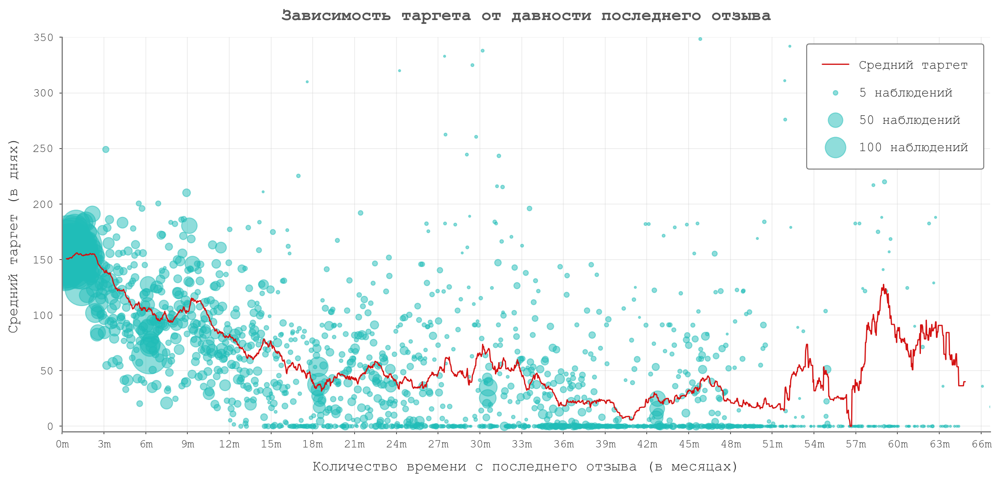

In [18]:
fig, ax = plt.subplots(figsize=(14, 6))

grouped = (df_train[df_train['days_since_last_review'] != -1]
    .groupby('days_since_last_review')['target'].agg(['mean', 'count']))

# полный диапазон дней
days_range = range(int(grouped.index.min()), int(grouped.index.max()) + 1)
grouped_full = grouped.reindex(days_range)

# сглаживание
smooth = grouped_full['mean'].rolling(50, min_periods=10).mean()

# линия
ax.plot(smooth, color=dimred, linewidth=1, label="Средний таргет")

# точки по агрегатам
ax.scatter(
    grouped.index,
    grouped['mean'],
    s=grouped['count']*3 ,   
    alpha=0.5,
    color=box,
)

# легенда для scatter
for size in [5, 50, 100]:
    ax.scatter([], [], s=size*3, color=box, alpha=0.5,
               label=f'{size} наблюдений')

ax.legend(loc='upper right',
    frameon=True, facecolor='white', framealpha=1,
    edgecolor='#777777', borderpad=1.2,
    labelspacing=1.2)

# месяцы на оси Х
ticks = np.arange(0, 2001, 90)
labels = [f"{int(x/30)}m" for x in ticks]

ax.set_xticks(ticks)
ax.set_xticklabels(f"{int(x/30)}m" for x in ticks)

ax.set_xlim(0, 2000)
ax.set_ylim(-5, 350)

ax.set_title("Зависимость таргета от давности последнего отзыва")
ax.set_xlabel("Количество времени с последнего отзыва (в месяцах)")
ax.set_ylabel("Средний таргет (в днях)")

plt.show()

В пределах 1-1.5 лет со дня последнего отзыва есть определенная взаимосвязь давности отзыва и таргета: объекты с недавней активностью лучше сдаются. Похоже что отзывы в пределах 2 месяцев влияют одинаково – средняя линия держится на уровне около 150-160 (это близко к медиане таргета без учета нулевых значений = 167). Дальше идет довольно плавный спад, но в пределах 12 месяцев практически нет нулевых значений таргета. То есть если объект действительно сдается, то его снимают. После давности отзыва 12 месяцев есть наблюдения с разными значениями таргета, в том числе большими (долгосрочная аренда), но выделяется отдельный кластер объектов с нулевым таргетом, лежащих на оси Х. Вероятно именно эти объекты создают большой пик распределения в 0, то есть они есть в базе, но по факту не сдаются.

---

#### Числовые признаки

In [19]:
num_cols

['sum', 'min_days', 'amt_reviews', 'avg_reviews', 'total_host']

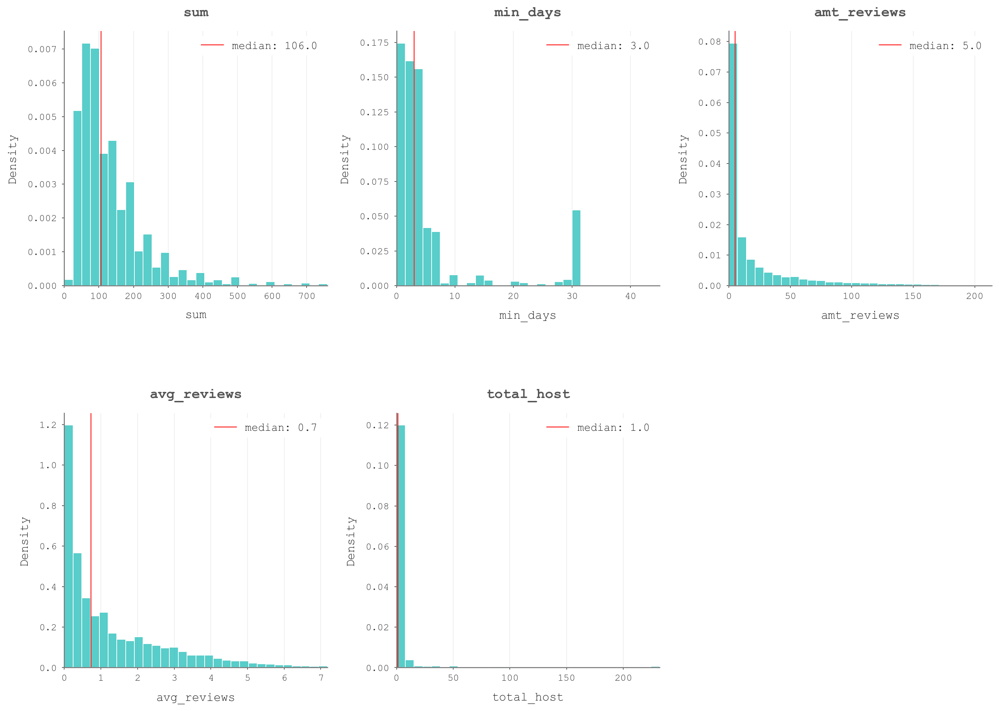

In [20]:
fig, axes = plt.subplots(2, 3, figsize=(14, 10))

# для всех признаков в num_cols
for i, col in enumerate(num_cols):
    ax = axes.flatten()[i]

    # 99 квантиль
    q99 = df_train[col].quantile(0.99)

    # histplot по всему датафрейму, динамические бины
    sns.histplot(df_train[col], stat='density', 
        bins=30, binrange=(0, q99), ax=ax)

    # лимит оси по 99 квантилю
    ax.set_xlim(0, q99)

    # медианы
    median = df_train[col].median()
    ax.axvline(median, color='red', lw=1, alpha=0.8,
               label=f"median: {median:.1f}")

    ax.set_title(col)
    ax.grid(axis='y', visible=False)
    ax.legend(frameon=True, facecolor='white', edgecolor='white', framealpha=1,)

# убрать пустой график
for j in range(len(num_cols), 6):
    axes.flatten()[j].axis('off')

plt.tight_layout()
plt.subplots_adjust(hspace=0.5)
plt.show()

- sum: большинство значений в диапазоне ~25–200, распределение с длинным правым хвостом. Есть редкие выбросы высоких значений.

- min_days: в основном 1–5 дней, распределение сильно скошено вправо. Отдельный пик на 30 дней (помесячная аренда).

- amt_reviews: много объектов с небольшим количеством отзывов, распределение с длинным хвостом. Есть отдельные объекты с очень большим числом отзывов.

- avg_reviews: большинство значений низкие (до ~2), распределение правосторонне асимметричное. Более высокие значения встречаются редко.

- total_host: у большинства хостов мало объектов, распределение сильно скошено вправо. Есть небольшое количество хостов с большим числом объектов.

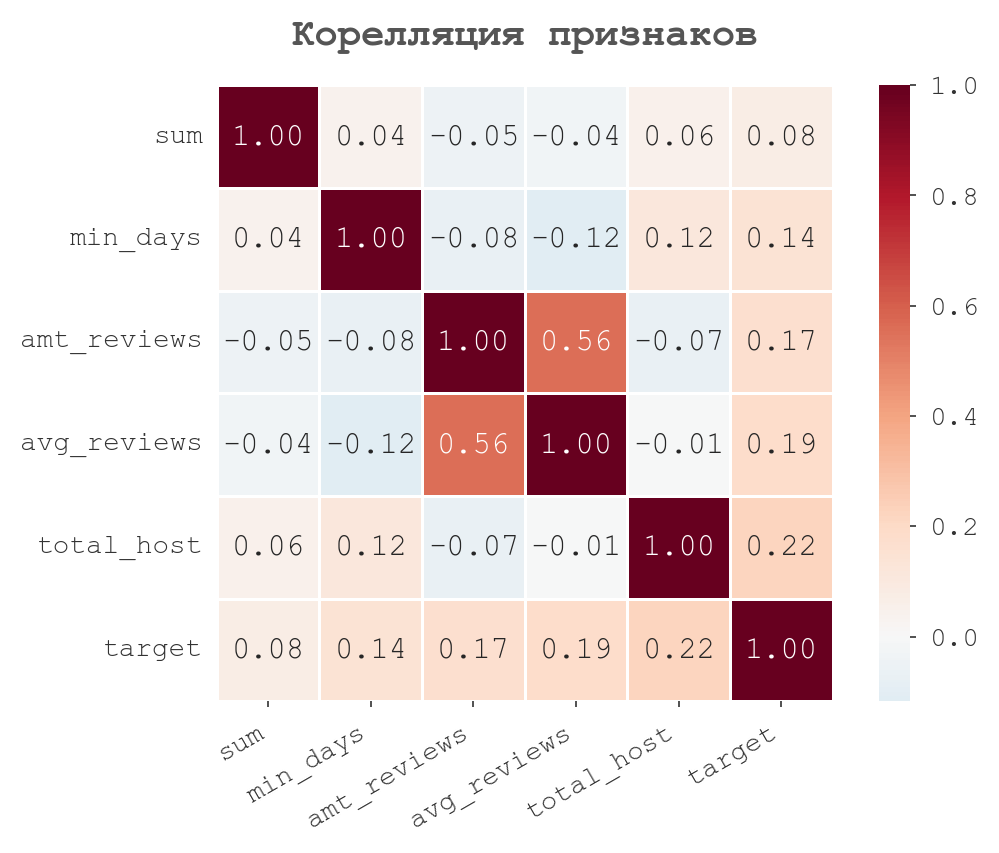

In [21]:
corr = df_train[num_cols+['target']].corr()

plt.figure(figsize=(6, 4))
ax = sns.heatmap(
    corr,
    annot=True,
    fmt=".2f",
    cmap="RdBu_r",
    center=0,
    square=True,            
    linewidths=0.5
)
ax.tick_params(axis='y', length=0)
plt.xticks(rotation=30, ha='right')
plt.title("Корелляция признаков")
plt.show()

- sum: практически не связан с другими признаками и таргетом (корреляции близки к нулю). 
- min_days: слабая положительная связь с таргетом (~0.14). Также немного связан с total_host, влияние слабое.
- amt_reviews: умеренная связь с avg_reviews (~0.56), что логично — признаки частично отражают одно и то же. С таргетом связь слабая (~0.17).
- avg_reviews: слабая положительная связь с таргетом (~0.19). Один из более информативных признаков, но эффект не большой.
- total_host: самая высокая корреляция с таргетом (~0.22) среди всех признаков.
- target: ни с одним признаком нет сильной линейной зависимости. Все корреляции слабые (<0.25), возможна нелинейность или влияние комбинаций признаков.

----

#### Категориальные признаки

In [22]:
cat_cols

['location_cluster', 'location', 'type_house']

##### 1. 'location_cluster'

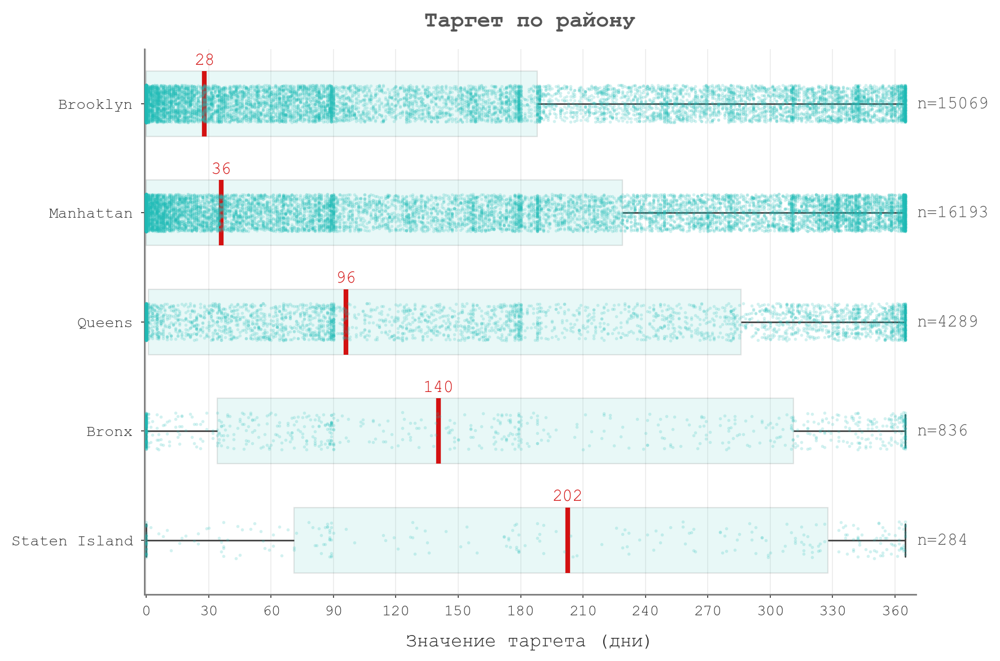

In [23]:
fig, ax = plt.subplots(figsize=(9, 6))

# порядок кластеров по медиане
order = (df_train.groupby('location_cluster')['target']
    .median().sort_values().index)

# boxplot
sns.boxplot(data=df_train,
    y='location_cluster', x='target', order=order,
    width=0.6, ax=ax,
    medianprops=dict(color=dimred, linewidth=3),
    boxprops=dict(facecolor=box, edgecolor='black', alpha=0.1, linewidth=0.8),
    whiskerprops=dict(linewidth=1),
    capprops=dict(linewidth=1)
)

# stripplot
sns.stripplot(data=df_train,
    x='target', y='location_cluster', order=order,
    color=box, jitter=0.17, alpha=0.2, size=2, ax=ax)

# медианы
medians = (df_train.groupby('location_cluster')['target']
    .median().reindex(order))

for i, val in enumerate(medians):
    ax.text(val, i - 0.40,
        f"{val:.0f}", va='center', ha='center',
        fontsize=11, color=dimred)

# количество объектов
counts = df_train['location_cluster'].value_counts().reindex(order)

x_max = 365

for i, cat in enumerate(order):
    ax.text(x_max * 1.015, i,
        f"n={counts[cat]}", va='center',
        fontsize=11, color='#555555')

ax.set_xticks( np.arange(0, 366, 30))

# оформление
ax.set_xlim(-1, 370)
ax.set_title("Таргет по району")
ax.set_xlabel("Значение таргета (дни)")
ax.set_ylabel("")
ax.grid(axis='y', visible=False)

plt.tight_layout()
plt.show()

Распределение таргета по району показывает что район не релевантен как признак и не несет особой информации. Во всех районах распределения таргета похожи – широкий разброс значений во всем диапазоне. Внутри каждого района распределение таргета выглядит достаточно равномерно. Чуть больше наблюдений в хвостах распределений чем в середине, но это консистентно между кластерами локаций. Есть отдельные уплотнения в виде вертикальных скоплений точек в одних и тех же местах на уровне например 3 месяца, 6 месяцев, но этот паттерн так же одинаков по всем районам.

Основное различие между районами – в количестве наблюдений. Категории кластеров представлены неравномерно, Бруклин и Манхеттен содержат больше 15000 объектов каждый, а Бронкс и Стейтен-Айленд всего 836 и 284 соответственно.

In [24]:
train_dist = df_train['location_cluster'].value_counts(normalize=True)
test_dist = df_test['location_cluster'].value_counts(normalize=True)

pd.concat([train_dist, test_dist], axis=1, keys=['train', 'test']).round(3)

,train,test
location_cluster,,
Manhattan,0.442,0.447
Brooklyn,0.411,0.412
Queens,0.117,0.113
Bronx,0.023,0.021
Staten Island,0.008,0.007


Распределение 'location_cluster' в train и test совпадает. Этот признак дублирует географическую информацию (latitude, longitude).

##### 2. 'location'

In [25]:
df_train.groupby('location_cluster')['location'].nunique()

location_cluster
Bronx            48
Brooklyn         47
Manhattan        32
Queens           51
Staten Island    42
Name: location, dtype: int64

In [26]:
print(f"Всего уникальных location: {df_train['location'].nunique()}")
print(f"location присутствуют больше чем в одном кластере: {(df_train.groupby('location')['location_cluster'].nunique() > 1).sum()}")

Всего уникальных location: 220
location присутствуют больше чем в одном кластере: 0


location_cluster агрегирует location в группы, т.е. location это мелкая детализация внутри района.

##### 3. 'type_house'

In [27]:
train_dist = df_train['type_house'].value_counts(normalize=True)
test_dist = df_test['type_house'].value_counts(normalize=True)

pd.concat([train_dist, test_dist], axis=1, keys=['train', 'test']).round(3)

,train,test
type_house,,
Entire home/apt,0.518,0.523
Private room,0.458,0.453
Shared room,0.024,0.023


Распределение 'type_house' в train и test совпадает, сдвига распределения в этих выборках нет. Доля shared_room всего ~2%, категории представлены неравномерно.

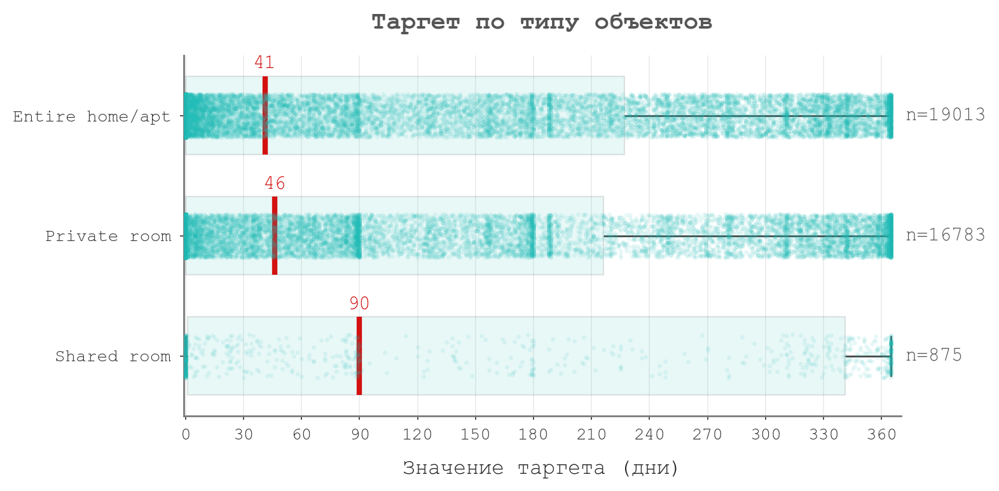

In [28]:
fig, ax = plt.subplots(figsize=(8, 4))

# порядок категорий
order = df_train['type_house'].value_counts().index

# boxplot
sns.boxplot(data=df_train, y='type_house', x='target',
    order=order, width=0.65, ax=ax, 
    medianprops=dict(color=dimred, linewidth=3, alpha=1), 
    boxprops=dict(facecolor=box, edgecolor='black', alpha=0.1, linewidth=0.8),
    whiskerprops=dict(linewidth=1),
    capprops=dict(linewidth=1)
    )

# stripplot
sns.stripplot(data=df_train,
    x='target', y='type_house',
    order=order, color=box, jitter=0.18,
    alpha=0.1, size=2.5, ax=ax)

# медианы
medians = df_train.groupby('type_house')['target'].median().reindex(order)

for i, val in enumerate(medians):
    ax.text(val, i-0.43, f"{val:.0f}",
        va='center', ha='center',
        fontsize=11, color=dimred)

# количество наблюдений
counts = df_train['type_house'].value_counts().reindex(order)
x_max = 365

for i, cat in enumerate(order):
    ax.text(x_max * 1.02, i,
        f"n={counts[cat]}",
        va='center', fontsize=11,
        color='#555555')
    
ax.set_xticks( np.arange(0, 366, 30))

# оформление
ax.set_xlim(-1, 370)
ax.set_title("Таргет по типу объектов")
ax.set_xlabel("Значение таргета (дни)")
ax.set_ylabel("")
ax.grid(axis='y', visible=False)

plt.tight_layout()
plt.show()

Несмотря на более высокую медиану в категории shared_room, учитывая долю наблюдений всего ~2%, выводов о более высокой загрузке этого типа объектов сделать нельзя. По категориям entire home/apt и private room распределения сильно перекрываются, разброс внутри категорий большой – связь с таргетом слабая. Видны отдельные вертикальные кластеры точек например на значении таргета 3 месяца и 6 месяцев. Распределение таргета по типам объектов имеет примерно похожую структуру, но категории неравномерны по количеству объектов.

----

#### Гео признаки

In [29]:
import plotly.express as px

fig = px.scatter_mapbox(
    df_train,
    lat="lat",
    lon="lon",
    color="target",
    hover_name="name",
    hover_data=[
        'sum',
        'min_days',
        'amt_reviews',
        'avg_reviews',
        'total_host',
        'days_since_last_review'
    ],
    zoom=9.5,
    height=700,
    width=700,  
    color_continuous_scale="Viridis",
)

fig.update_layout(mapbox_style="open-street-map")
fig.show()

/var/folders/vj/mjshxlvj4hxdrtj0f2_wfwdw0000gn/T/ipykernel_22891/142389608.py:3: DeprecationWarning: *scatter_mapbox* is deprecated! Use *scatter_map* instead. Learn more at: https://plotly.com/python/mapbox-to-maplibre/
  fig = px.scatter_mapbox(


<p align="left" style="color: #949494; font-size: 12px;">
  <em>[ Plotly map screenshot ]</em>
</p>

<p align="left">
  <img src="utils/plotly_map.jpg" alt="Plotly map screenshot" width="900">
</p>


Высокие/низкие значения таргета не формируют четких кластеров и рассеяны по всем районам города. Внутри каждого района высокая вариативность таргета.

---

#### ID признаки

In [30]:
id_cols

['_id', 'name', 'host_name']

In [31]:
df_train.head(10)

,name,_id,host_name,location_cluster,location,lat,lon,type_house,sum,min_days,amt_reviews,avg_reviews,total_host,target,is_zero_days,days_since_last_review
0,Belle Harbor 4 BR 2 bath- 1 bl from Beach,40327248,Sarina,Queens,Neponsit,40.57215,-73.85822,Entire home/apt,350,2,5,2.88,1,334,0,1.0
1,"Come see Brooklyn, New York",13617520,Howard T.,Brooklyn,Clinton Hill,40.69172,-73.96934,Shared room,40,5,8,0.13,1,0,1,1594.0
2,Large 2Br on W71st & Columbus Feb 19-28,26754726,Julie,Manhattan,Upper West Side,40.77673,-73.98011,Entire home/apt,200,5,0,NaN,1,0,1,-1.0
3,Perfect bedroom. Near Subways Columbia CityCol...,16721721,Federico,Manhattan,Harlem,40.81530,-73.95080,Private room,65,2,18,0.64,1,0,1,246.0
4,Cozy Sun Filled Fresh Guest Room in Artsy Bush...,22246463,Lisa,Brooklyn,Bushwick,40.70230,-73.92935,Private room,99,2,26,0.76,1,155,0,15.0
5,Comfortable Duplex Studio with Balcony! Near t...,120643397,Rachel,Brooklyn,Midwood,40.62258,-73.97398,Entire home/apt,139,2,41,3.70,1,62,0,1.0
6,Simple PRIVATE ROOM in UNION SQUARE,88073013,Rui,Manhattan,Gramercy,40.73421,-73.98834,Private room,85,2,47,1.32,1,18,0,34.0
7,RENOVATED 2 BEDROOM APT NEAR CENTRAL PARK WEST,9293730,Inna,Manhattan,Upper West Side,40.79638,-73.96332,Entire home/apt,125,30,1,0.09,16,284,0,338.0
8,"Charming, spacious UES studio",19529891,Shilpa,Manhattan,Upper East Side,40.76870,-73.95560,Entire home/apt,135,3,0,NaN,1,0,1,-1.0
9,Beautiful garden apartment,88111418,Micheline,Queens,St. Albans,40.69113,-73.75524,Entire home/apt,70,3,12,1.31,1,323,0,18.0


host_name не уникален, это могут быть разные люди с одинаковым именем.

In [32]:
print("Объектов в train:", df_train.shape[0])
print("Объектов в test:", df_test.shape[0], "\n")

print("Пересечение ID в train и test:", len(set(df_train['_id']) & set(df_test['_id'])))
print("Пересечение 'host_name' в train и test:", len(set(df_train['host_name']) & set(df_test['host_name'])), "\n")

print("1 id > 1 host:", (df_train.groupby('_id')['host_name'].nunique() > 1).sum())
print("1 id > 1 listing name:", (df_train.groupby('_id')['name'].nunique() > 1).sum())

print(
    f"\nДоля одинаковых id с разными координатами объектов (lat / lon): "
    f"{(df_train.groupby('_id')[['lat','lon']].nunique().max(axis=1) > 1).mean():.2%}"
)

Объектов в train: 36671
Объектов в test: 12224 

Пересечение ID в train и test: 2447
Пересечение 'host_name' в train и test: 2840 

1 id > 1 host: 0
1 id > 1 listing name: 3461

Доля одинаковых id с разными координатами объектов (lat / lon): 12.03%


В train и test выборках есть пересечения признаков _id (2447 совпадений) и host_name (2840 совпадений). Примерно каждый пятый объект из test встречается и в train. Использовать эти признаки напрямую как категориальные рискованно, модель может запоминать поведение конкретных хостов, а не находить закономерности.

Для каждого значения _id соответствует не более одного host_name, и на одном id может быть более одного объекта (3461 случаев), при этом в 12% случаев гео.координаты этих объектов не совпадают, значит id скорее идентифицирует хоста или группу объектов/объявлений одного хоста.

---

# Data preprocessing

## Target binning for stratification

In [33]:
# df_train_original - оригинальный датасет (скопирован до EDA)

# разбиение на 5 бинов
bins = pd.qcut(
    df_train_original['target'],
    5,
    duplicates='drop'
)

# идентификаторы бинов - в датафрейм
df_train_original['target_bin'] = bins.cat.codes

# границы бинов - для графика
print(bins.cat.categories)

IntervalIndex([(-0.001, 8.0], (8.0, 93.0], (93.0, 272.0], (272.0, 365.0]], dtype='interval[float64, right]')


**qcut** разбивает массив данных на сегменты одинакового размера по квантилям (5 бинов: 0-20% наблюдений, 20-40%, 40-60%, 60-80%, 80-100%). В датасете 37% одинаковых значений таргета =0, смежные границы первого и второго бина имели бы значение 0. qcut не может делить одинаковые значения на несколько бинов, поэтому дублирующие границы удаляются (бины 1 и 2 схлопываются вместе). Поэтому бинов стало меньше (4 вместо 5).

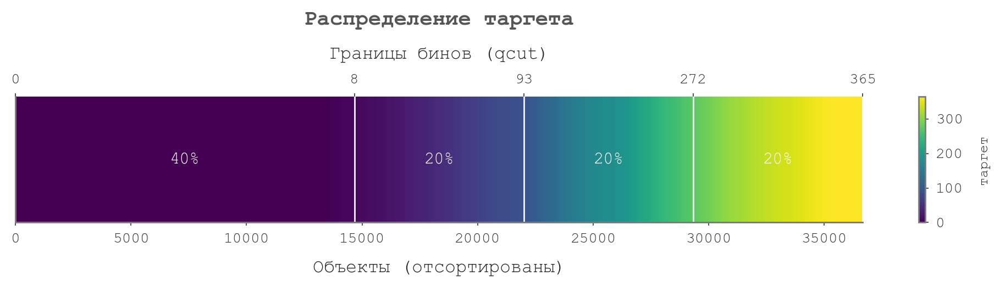

In [34]:
# данные для графика
target = df_train_original['target'].values
sorted_target = np.sort(target)

# границы бинов
categories = bins.cat.categories
edges = [categories[0].left] + [interval.right for interval in categories]
edges[0] = 0  

# позиции на оси X
positions = [
    np.searchsorted(sorted_target, edge) if edge != edges[-1]
    else len(sorted_target) - 1
    for edge in edges
]

# counts по бинам 
counts = pd.Series(bins).value_counts().sort_index()
shares = counts / len(target)

# =====================================================
fig, ax = plt.subplots(figsize=(9, 2.5), constrained_layout=True)

im = ax.imshow(sorted_target.reshape(1, -1), aspect='auto',  cmap='viridis')

ax.grid(False)
ax.set_yticks([])
ax.set_xlabel("Объекты (отсортированы)")
ax.set_title("Распределение таргета")

# линии границ бинов
for pos in positions:
    ax.axvline(pos, color='white', linestyle='-', lw=1, alpha=1)

# верхняя ось (границы бинов) 
ax_top = ax.twiny()
ax_top.set_xlim(ax.get_xlim())

ax_top.set_xticks(positions)
ax_top.set_xticklabels([f"{int(e)}" for e in edges])
ax_top.set_xlabel("Границы бинов (qcut)")

# подписи по центру бинов 
for i in range(len(positions) - 1):
    left = positions[i]
    right = positions[i + 1]
    x_center = (left + right) / 2

    share = shares.iloc[i]

    ax.text(x_center, 0.5, f"{share:.0%}", fontsize=11,
        ha='center', va='center', color='white',
        transform=ax.get_xaxis_transform())

# colorbar 
cbar = fig.colorbar(im, ax=ax)
cbar.set_label("таргет", fontsize=9)

plt.show()

In [35]:
# диагностика баланса таргета в бинах после skf
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=1)

print("\n=== StratifiedKFold ===")

for i, (_, val_idx) in enumerate(skf.split(df_train_original, df_train_original['target_bin'])):
    y_val = df_train_original.iloc[val_idx]['target']
    print(f"Fold {i}: mean={y_val.mean():.2f}, zeros={(y_val==0).mean():.2f}")


=== StratifiedKFold ===
Fold 0: mean=112.70, zeros=0.36
Fold 1: mean=112.58, zeros=0.36
Fold 2: mean=113.23, zeros=0.36
Fold 3: mean=112.54, zeros=0.36
Fold 4: mean=112.78, zeros=0.36


StratifiedKFold по `target_bin` корректно сохраняет распределение таргета между фолдами. Среднее значение target почти одинаковое (~112). Доля нулей стабильна, около 36% в каждом фолде. Стратификация работает корректно.

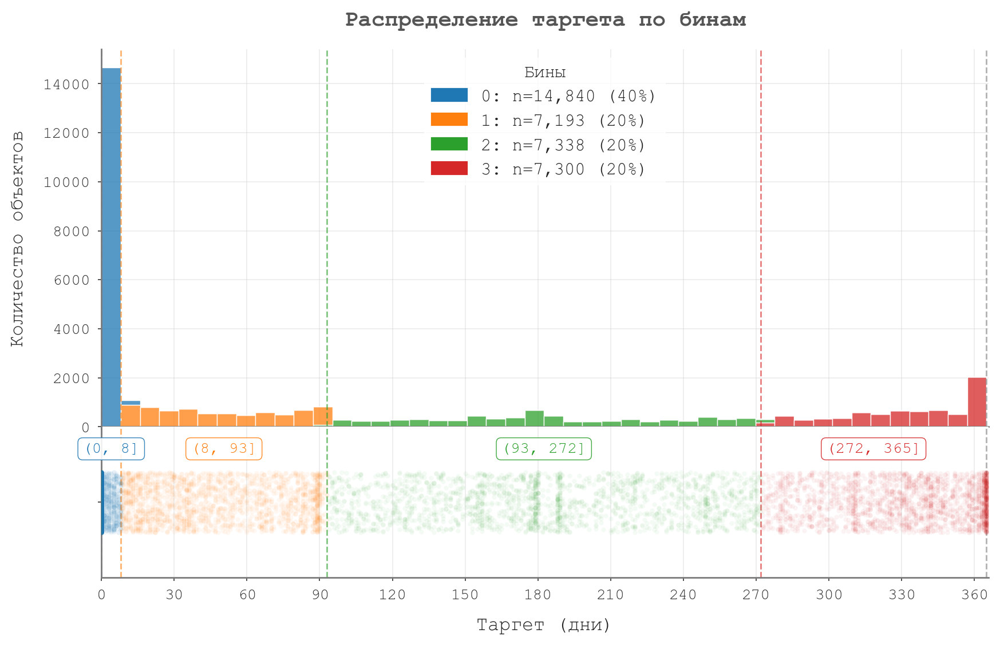

In [36]:
from matplotlib.patches import Patch

fig, axes = plt.subplots(2, 1, figsize=(10, 6), sharex=True,
    gridspec_kw={'height_ratios': [1, 0.4], 'hspace': 0})

# bins 
categories = bins.cat.categories
bin_edges = [cat.left for cat in categories] + [categories[-1].right]

# counts
counts = df_train_original['target_bin'].value_counts().sort_index()
total = len(df_train_original)

palette = sns.color_palette('tab10', n_colors=len(categories))

# HISTPLOT -----------------
ax = axes[0]

sns.histplot(data=df_train_original, x='target', hue='target_bin',
    multiple='stack', bins=46, legend=False, ax=ax,
    edgecolor='white', linewidth=0.5, palette=palette)

# легенда
legend_elements = [
    Patch(
        facecolor=palette[i],
        edgecolor=palette[i],
        label=f"{i}: n={counts[i]:,} ({counts[i]/total:.0%})"
    )
    for i in counts.index
]

ax.legend(handles=legend_elements, title="Бины",
    loc='upper center', ncol=1,
    frameon=True, facecolor='white', edgecolor='white')

ax.set_ylabel("Количество объектов")
ax.set_title("Распределение таргета по бинам")


# STRIPPLOT --------------------
sample = df_train_original.sample(10000, random_state=42)

for i, (interval, color) in enumerate(zip(categories, palette)):
    # точки из i-того бина
    sns.stripplot(
        data=sample[sample['target_bin'] == i], x='target',
        color=color, jitter=0.2, alpha=0.05, size=3, ax=axes[1])

    # границы бина
    left = max(0, interval.left)
    right = interval.right

    # центр интервала
    x_center = (interval.left + interval.right) / 2

    # аннотация
    axes[1].annotate(f"({left:.0f}, {right:.0f}]",
        xy=(x_center, 0.8), xycoords=('data', 'axes fraction'),
        xytext=(0, 3), textcoords='offset points',
        ha='center', fontsize=10, color=color,
        bbox=dict(boxstyle='round,pad=0.3',
            facecolor='white', edgecolor=color, lw=0.5, alpha=0.9)
        )

# линии границ бинов
for i, edge in enumerate(bin_edges[:-1]):
    for ax in axes:
        ax.axvline(edge, color=palette[i], linestyle='--', lw=1, alpha=0.6)

for ax in axes:
    ax.axvline(bin_edges[-1], color='gray', linestyle='--', lw=1, alpha=0.6)

axes[1].set_xlabel("Таргет (дни)")

plt.xticks(np.arange(0, 366, 30))
plt.xlim(0, 366)

plt.subplots_adjust(hspace=0)
plt.show()

**Разделение на бины для Stratified KFold**\
Из-за большого количества нулей квантильные границы совпадают, поэтому qcut не может разделить данные на 5 равных частей и уменьшает число бинов до 4. В первый бин попадают все нули и часть малых значений (~40%), остальные бины содержат примерно по 20% наблюдений.

----

## Features

### Feature engineering

In [37]:
df_train_original.dtypes

name                    str
_id                   int64
host_name               str
location_cluster        str
location                str
lat                 float64
lon                 float64
type_house              str
sum                   int64
min_days              int64
amt_reviews           int64
last_dt                 str
avg_reviews         float64
total_host            int64
target                int64
target_bin             int8
dtype: object

In [38]:
# создание обучающего и тестового наборов данных

X_full = df_train_original.drop(columns=['target', 'target_bin']).copy()
y_full = df_train_original['target'].copy()
target_bin = df_train_original['target_bin'].copy()

X_test = df_test_original.copy()

# заполнение пропусков в avg_reviews нулями
X_full['avg_reviews'] = X_full['avg_reviews'].fillna(0)
X_test['avg_reviews'] = X_test['avg_reviews'].fillna(0)

# совпадает ли количество признаков в train и test
assert X_full.shape[1] == X_test.shape[1]

In [39]:
# совпадает ли количество строк в X_train_full и y
assert (X_full.index == y_full.index).all()

---

#### Date columns

In [40]:
# преобразование last_dt в datetime с обработкой ошибок
X_full['last_dt'] = pd.to_datetime(X_full['last_dt'], errors='coerce')
X_test['last_dt'] = pd.to_datetime(X_test['last_dt'], errors='coerce')

# дата самого последнего отзыва
max_date = X_full['last_dt'].max()

# новый признак для давности последнего отзыва
X_full['days_since_last_review'] = (max_date - X_full['last_dt']).dt.days
X_test['days_since_last_review'] = (max_date - X_test['last_dt']).dt.days

# заполнение пропусков в days_since_last_review значением -1, чтобы не смешивать с реальными 0
X_full['days_since_last_review'] = X_full['days_since_last_review'].fillna(-1)
X_test['days_since_last_review'] = X_test['days_since_last_review'].fillna(-1)

# удаление столбца last_dt, так как он больше не нужен  
X_full.drop(columns='last_dt', inplace=True)
X_test.drop(columns='last_dt', inplace=True)

'last_dt' преобразована в числовой признак 'days_since_last_review'

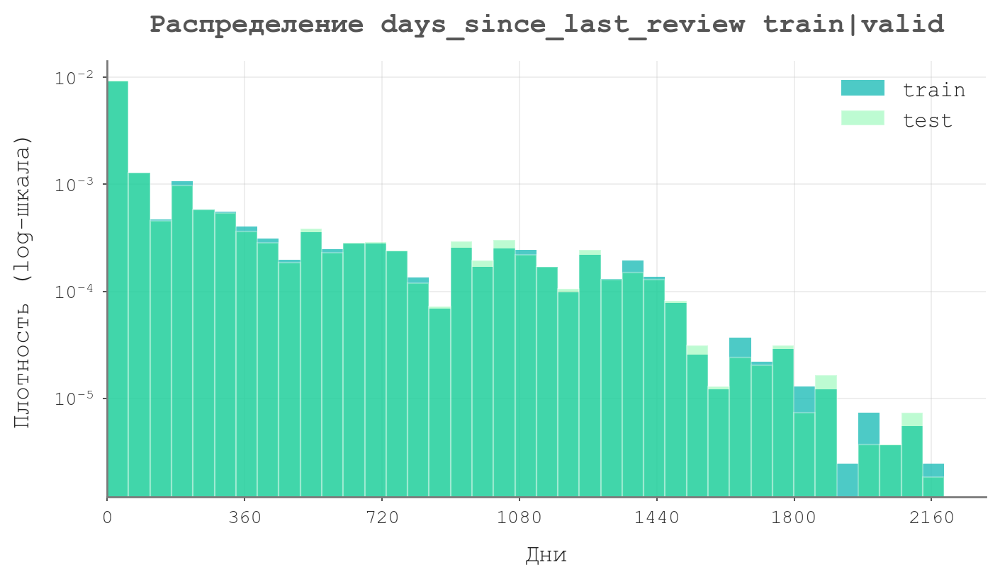

In [41]:
# сравнение распределений 'days_since_last_review' в train и test
bins = np.linspace(0, X_full['days_since_last_review'].quantile(0.999), 40)

X_full['days_since_last_review'].hist(bins=bins, density=True, alpha=0.8, label='train', color=box)
X_test['days_since_last_review'].hist(bins=bins, density=True, alpha=0.3, label='test', color="#26F46A", edgecolor='white')

# лог-шкала чтобы были лучше видны ненулевые значения
plt.yscale('log')
plt.xlim(xmin=0)
plt.legend()
plt.xticks(np.arange(0,2200,360))
plt.xlabel('Дни')
plt.ylabel('Плотность (log-шкала)')
plt.title('Распределение days_since_last_review train|valid')
plt.show()

Распределения в целом похожи, пик около 0, похожая асимметрия. В train больше экстремальных значений (>2000), диапазон значений шире.

---

#### Geo features

In [42]:
geo_cols

['lat', 'lon']

In [43]:
# bearing degree
def bearing_degree(lat, lon, base_lat=0, base_lon=0):
    phi1 = math.radians(base_lat)
    phi2 = math.radians(lat)
    dlon = math.radians(lon - base_lon)
    x = math.sin(dlon) * math.cos(phi2)
    y = math.cos(phi1) * math.sin(phi2) - math.sin(phi1) * math.cos(phi2) * math.cos(dlon)
    degree = (math.degrees(math.atan2(x, y)) + 360) % 360
    return degree

# haversine distance
def haversine_distance(lat, lon, base_lat=0, base_lon=0):
    R = 6371.0  # км
    phi1 = math.radians(base_lat)
    phi2 = math.radians(lat)
    dphi = math.radians(lat - base_lat)
    dlon = math.radians(lon - base_lon)
    a = math.sin(dphi / 2) ** 2 + math.cos(phi1) * math.cos(phi2) * math.sin(dlon / 2) ** 2
    c = 2 * math.atan2(math.sqrt(a), math.sqrt(max(0.0, 1.0 - a)))
    distance = R * c
    return distance

In [44]:
# середина города по координатам из train
base_lat = df_train['lat'].mean()
base_lon = df_train['lon'].mean()
    
# добавление 'bearing_degree'
X_full['bearing_degree'] = X_full.apply(lambda x: bearing_degree(x['lat'], x['lon'], base_lat=base_lat, base_lon=base_lon), axis=1)
X_test['bearing_degree'] = X_test.apply(lambda x: bearing_degree(x['lat'], x['lon'], base_lat=base_lat, base_lon=base_lon), axis=1)

# добавление 'haversine_distance'
X_full['haversine_distance'] = X_full.apply(lambda x: haversine_distance(x['lat'], x['lon'], base_lat=base_lat, base_lon=base_lon), axis=1)
X_test['haversine_distance'] = X_test.apply(lambda x: haversine_distance(x['lat'], x['lon'], base_lat=base_lat, base_lon=base_lon), axis=1)


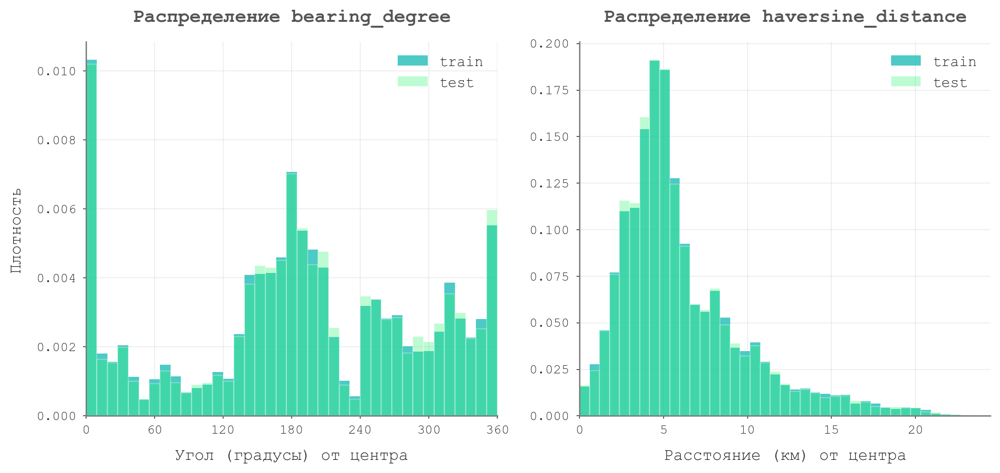

In [45]:
# сравнение распределений 'bearing_degree', 'haversine_distance' в train и test

fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# bins
bins_b = np.linspace(0, 360, 40)
bins_h = np.linspace(0, X_full['haversine_distance'].quantile(0.999), 40)

# hist: bearing
X_full['bearing_degree'].hist(bins=bins_b, density=True, alpha=0.8, label='train', ax=axes[0])
X_test['bearing_degree'].hist(bins=bins_b, density=True, alpha=0.3, label='test', ax=axes[0], 
    color="#26F46A", edgecolor='white')

# hist: haverstine
X_full['haversine_distance'].hist(bins=bins_h, density=True, alpha=0.8, label='train', ax=axes[1])
X_test['haversine_distance'].hist(bins=bins_h, density=True, alpha=0.3, label='test', ax=axes[1],
    color="#26F46A", edgecolor='white')

axes[0].set_title('Распределение bearing_degree')
axes[1].set_title('Распределение haversine_distance')

axes[0].set_xlim(0, 360)
axes[0].set_xticks(np.arange(0, 361, 60))
axes[1].set_xlim(left=0)

axes[0].set_ylabel('Плотность')
axes[0].set_xlabel('Угол (градусы) от центра')
axes[1].set_xlabel('Расстояние (км) от центра')

axes[0].legend()
axes[1].legend()
plt.show()

Распределения гео.признаков в обучающей и тестовой выборках совпадают.

---

#### ID features

In [46]:
id_cols

['_id', 'name', 'host_name']

In [47]:
# удаляем id-признаки из выборок
X_full.drop(columns=id_cols, inplace=True)
X_test.drop(columns=id_cols, inplace=True)

---

#### Categorical features

In [48]:
cat_cols

['location_cluster', 'location', 'type_house']

In [49]:
for col in cat_cols:
    X_full[col] = X_full[col].astype('category')
    X_test[col] = X_test[col].astype('category')

По результатам исследования feature selection эти признаки используются большинством моделей минимально и не улучшают метрику MSE.
Часть моделей могут извлечь из них дополнительную информацию судя по улучшению метрик, поэтому оставлю их в датасете для возможности точечного добавления в отдельные модели.

---

#### Numerical features

In [50]:
num_cols

['sum', 'min_days', 'amt_reviews', 'avg_reviews', 'total_host']

Числовые признаки пойдут в модель без изменений.

In [51]:
print(f"Пропуски в train: {X_full.isna().sum()[X_full.isna().sum() > 0].sort_values(ascending=False)}")
print(f"Пропуски в test: {X_test.isna().sum()[X_test.isna().sum() > 0].sort_values(ascending=False)}")


Пропуски в train: Series([], dtype: int64)
Пропуски в test: Series([], dtype: int64)


---

#### Выводы

По результатам нескольких экспериментов по feature engineering и feature selection (ниже) для бустинговых моделей получила такие выводы:

1. Клиппинг числовых признаков по 99% квантилю ухудшил метрику MSE для всех моделей (XGBoost, LightGBM, CatBoost, Random Forest). Экстремальные значения не шум, и содержат полезную для предсказаний информацию.

2. бинарные признаки
- 'no_reviews_flag' (AV = 0.50, feature_gain = 0.000, permutation = -0.000) — не используется моделями, дублирует days_since_last_review
- 'is_business_host' (AV = 0.49, feature_gain = 0.000, permutation = 0.000) – не используется, не улучшает качество предсказания

3. log-трансформация признаков с длинным правым хвостом в распределениях ('total_host_log', 'amt_reviews_log') не влияет на качество предсказания и метрики MSE. SHAP-анализ показал, что преобразованные признаки не используются, а исходные признаки остаются информативными. Логарифм является монотонным преобразованием, не изменяющим структуру разбиений.

4. Interaction признаки
- 'reviews_recent' = amt_reviews / (days_since_last_review + 1) – высокий вклад по SHAP, но это не привело к улучшению метрики MSE
- 'host_activity' = total_host * reviews_recent  – не улучшил качество предсказаний моделей.
Бустинговые модели способны автоматически моделировать нелинейные зависимости и взаимодействия между признаками, явное добавление этих признаков привело к дублированию информации и ухудшению обобщающей способности.

5. Удаление категориальных признаков 'location', 'type_house', 'location_cluster' иногда приводит к улучшению метрик для части моделей. Я оставила их выборочно только для тех моделей, где они улучшают MSE.

---

### Feature selection

In [52]:
import eli5
from eli5.sklearn import PermutationImportance

In [53]:
print("=== Полный список базовых признаков после обработки ===")
X_full.columns.to_list()

=== Полный список базовых признаков после обработки ===


['location_cluster',
 'location',
 'lat',
 'lon',
 'type_house',
 'sum',
 'min_days',
 'amt_reviews',
 'avg_reviews',
 'total_host',
 'days_since_last_review',
 'bearing_degree',
 'haversine_distance']

In [54]:
features = [
    'location_cluster',
    'location',
    'lat',
    'lon',
    'type_house',
    'sum',
    'min_days',
    'amt_reviews',
    'avg_reviews',
    'total_host',
    'days_since_last_review',
    'bearing_degree',
    'haversine_distance',
    ]

# категориальные признаки для encoder          
cat_features = [
    'location_cluster', 
    'location', 
    'type_house',
    ]


In [55]:
# полный обучающий датасет с выбранными фичами
X_full = X_full[features].copy()
X_test = X_test[features].copy()

assert X_full.shape[1] == X_test.shape[1]

---

##### **Stratified  test/valid split** для feature importance

In [56]:
# для feature importance достаточно одного сплита
X_train, X_valid, y_train, y_valid = train_test_split(
    X_full,
    y_full,
    test_size=0.2,
    random_state=1,
    stratify=target_bin     # stratify по бинам таргета
)

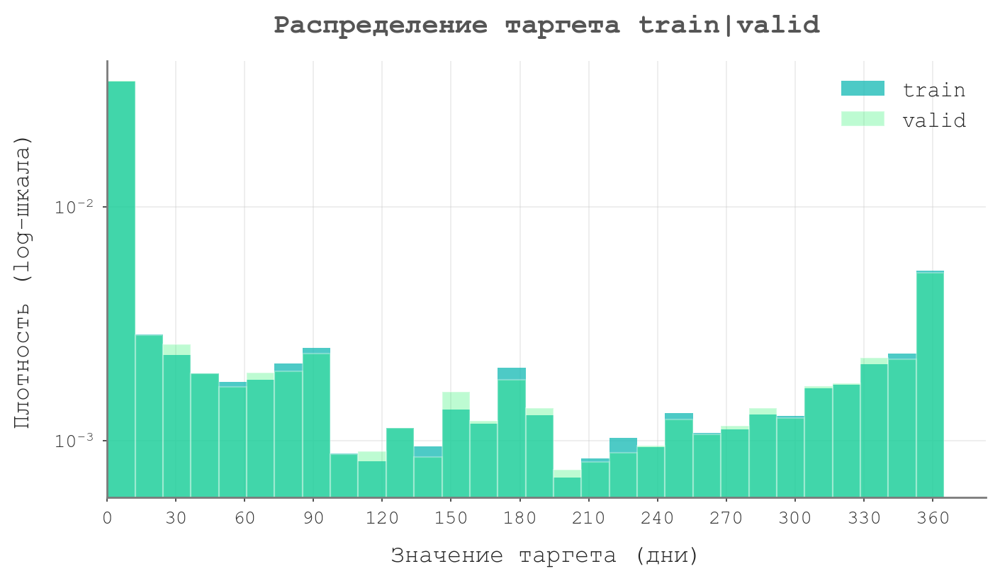

In [57]:
plt.figure(figsize=(8,4))

# сравнение распределений таргета в train и validation

y_train.hist(bins=30, density=True, alpha=0.8, label='train')
y_valid.hist(bins=30, density=True, alpha=0.3, label='valid',
    color="#26F46A", edgecolor='white')

# лог-шкала чтобы были лучше видны ненулевые значения
plt.yscale('log')
plt.xlim(xmin=0)

plt.ylabel('Плотность (log-шкала)')
plt.xlabel('Значение таргета (дни)')

plt.xticks(np.arange(0,366,30))

plt.legend()
plt.title('Распределение таргета train|valid')
plt.show()


На гистплоте после разделения обучающей выборки на test и validation распределение таргета осталось одинаковым в обеих выборках.

Численно по долям:

In [58]:
train_dist = (pd.Series(target_bin)
    .iloc[y_train.index]                         # только те строки, которые попали в train
    .value_counts(normalize=True).sort_index()   # normalize=True - доля бина в таргете
    )

valid_dist = pd.Series(target_bin).iloc[y_valid.index].value_counts(normalize=True).sort_index()

print(pd.DataFrame({
    'train': train_dist,
    'valid': valid_dist
}))

               train     valid
target_bin                    
0           0.404690  0.404635
1           0.196141  0.196183
2           0.200095  0.200136
3           0.199073  0.199046


Распределение target_bin совпало практически идеально. Stratify сработал корректно, train и valid репрезентативны.

---

##### **Adversarial Validation Score**

Adversarial Validation Score показывает, насколько train и test отличаются по признакам. Используется для диагностики сдвига распределений (distribution shift), который может ухудшать обобщающую способность модели.

Создается вспомогательная задача классификации:
1. Объединяются данные train и test
2. Объектам из train присваивается метка 0, из test – 1
3. Бинарный классификатор (например, LGBMClassifier) обучается различать выборки
4. Вычисляется AV score (ROC AUC)

ROC AUC ~ 0.5 означает, что модель не может отличить train от test, то есть распределения признаков практически совпадают.

In [59]:
from lightgbm import LGBMClassifier

In [60]:
# общий ROC AUC

# объединяем данные test и train
X_adv = pd.concat([X_test[features], X_full[features]]).reset_index(drop=True)

for col in cat_features:
    X_adv[col] = X_adv[col].astype('category')

# таргет: 1 = test, 0 = train
y_adv = np.hstack([
    np.ones(X_test.shape[0]),
    np.zeros(X_full.shape[0])
])

model = LGBMClassifier(n_estimators=100, max_depth=3, random_state=10, verbosity=-1)

adv_score = np.mean(
    cross_val_score(
        estimator=model,
        X=X_adv,
        y=y_adv,
        cv=5,
        scoring='roc_auc'
    )
)

print(f'Adversarial Validation Score: {adv_score:.2f} ROC AUC')

Adversarial Validation Score: 0.50 ROC AUC


Adversarial Validation Score: 0.50 ROC AUC. Train и test выглядят похожими по распределению признаков, модель не отличает их лучше случайного угадывания.

In [61]:
# ROC AUC по признакам

results = []

for feature in features:

    # объединяем данные test и train по признакам
    X_feat = pd.concat(
        [X_test[[feature]], X_full[[feature]]]
    ).reset_index(drop=True)

    if feature in cat_features:
        X_feat[feature] = X_feat[feature].astype('category')

    # таргет: 1 = test, 0 = train
    y_adv = np.hstack([
        np.ones(X_test.shape[0]),
        np.zeros(X_full.shape[0])
    ])

    model = LGBMClassifier(n_estimators=100, max_depth=3, random_state=10, verbosity=-1)
    
    # расчет AV score
    adv_score = np.mean(
        cross_val_score(
            estimator=model,
            X=X_feat,
            y=y_adv,
            cv=5,
            scoring='roc_auc',
        )
    )

    results.append((feature, adv_score))

adv_df = pd.DataFrame(results, columns=['feature', 'adv_score'])
adv_df = adv_df.sort_values(by='adv_score', ascending=False)

print(adv_df.head(15))

                   feature  adv_score
11          bearing_degree   0.505586
8              avg_reviews   0.502979
5                      sum   0.502866
7              amt_reviews   0.501890
9               total_host   0.501834
10  days_since_last_review   0.501258
4               type_house   0.501085
0         location_cluster   0.500727
3                      lon   0.500399
1                 location   0.496978
6                 min_days   0.496760
12      haversine_distance   0.496279
2                      lat   0.496038


Признаки стабильны между train и test, различия незначительные.

-------

##### **Encoder** для категориальных фич

Encoding – после сплита, чтобы encoder не видел валидационные данные

**CatBoostEncoder** преобразует текст/категории в числа, основываясь на значениях целевой переменной (Target Encoding).\
Алгоритм CatBoostEncoder предотвращает data leakage (текущая строка "не видит" свой собственный таргет):
1. случайная перестановка данных в обучающей выборке
2. накопительное среднее: для каждой строки значение признака рассчитывается только на основе тех строк, которые стоят выше неe в этом перемешанном списке
3. формула:\
$value_i = 
\dfrac{\text{sum\_target\_previous + smoothing * global\_mean}}
{\text{count\_previous + smoothing}}$

sum_target_previous — сумма таргета по предыдущим строкам\
count_previous — количество объектов с этой категорией по предыдущим строкам\
global_mean — глобальное среднее таргета по всей выборке.

На тестовых данных (через **.transform()**) энкодер использует уже среднее значение по всему тренировочному набору, так как порядок там уже не важен.

In [62]:
# # ШАБЛОН

# from category_encoders.cat_boost import CatBoostEncoder

# # создаем encoder
# encoder = CatBoostEncoder(cols=cat_features)

# # fit_transform обучаем на train 
# X_train = encoder.fit_transform(X_train, y_train)

# # transform применяет рассчитанные значения к valid   
# X_valid = encoder.transform(X_valid)

---

##### **Feature Importance** (в LightGBM)

Модель строит деревья и запоминает, какие признаки чаще всего помогали разделять данные.\
LightGBM рассчитывает два типа importance:
- gain: насколько сильно признак снижает ошибку. Каждый раз, когда дерево делает split считаем насколько уменьшилась ошибка и складываем по всем деревьям
- split: как часто признак используется для разбиения

Плюсы:
- Быстро: рассчитывается почти мгновенно, так как считается во время обучения.
- Показывает логику модели: какие признаки она реально использует.

Минусы:
- Смещение: склонна завышать важность признаков с большим количеством уникальных значений (их проще использовать для разделения данных).
- Переобучение: модель может использовать шум как сигнал, из-за чего важность будет завышена.


In [63]:
# feature importance с помощью LGBMRegressor

model = LGBMRegressor(random_state=1, verbose=-1)
model.fit(X_train, y_train)

importances_split = pd.Series(model.feature_importances_, index=X_train.columns)
importances_gain = pd.Series(model.booster_.feature_importance('gain'), index=X_train.columns)

# вывод в датафрейм: сравнение двух видов feature importance
gain_sorted = importances_gain.sort_values(ascending=False).reset_index()
gain_sorted.columns = ['feature_gain', 'gain']
gain_sorted['gain'] /= gain_sorted['gain'].sum()      # нормируем gain

split_sorted = importances_split.sort_values(ascending=False).reset_index()
split_sorted.columns = ['feature_split', 'split']
split_sorted['split'] /= split_sorted['split'].sum()  # нормируем split

df_compare = pd.concat([gain_sorted, split_sorted], axis=1)
df_compare

,feature_gain,gain,feature_split,split
0,total_host,0.372643,location,0.197000
1,location,0.130566,sum,0.141333
2,avg_reviews,0.117461,avg_reviews,0.113667
3,days_since_last_review,0.092738,days_since_last_review,0.092333
4,amt_reviews,0.076052,amt_reviews,0.088333
5,sum,0.071721,total_host,0.074667
6,min_days,0.068034,min_days,0.074333
7,lon,0.020969,haversine_distance,0.060000
8,haversine_distance,0.019808,lon,0.053667
9,type_house,0.014751,type_house,0.036667


Наиболее сильный признак по gain — total_host, он дает основной вклад в качество модели. 
Также заметный вклад дают location, avg_reviews, days_since_last_review, amt_reviews, sum и min_days.

По split чаще всего используются location, sum, avg_reviews, days_since_last_review и amt_reviews. Модель часто обращается к этим признакам при построении деревьев.

Географические признаки (lon, haversine_distance, lat, bearing_degree) используются, но их вклад ниже. 
location_cluster не используется моделью: его gain и split равны нулю.


---

##### **Permutation Importance** 
(RandomForest, LGBM, CatBoost)

Модель проверяет, какие признаки действительно важны для предсказания. Она по очереди перемешивает значения каждого признака и смотрит, как меняется метрика (например, $R^2$). Если качество модели заметно ухудшается – признак важный. Если почти не меняется — модель справляется и без него.

Плюсы:
- Честный тест: оценивает влияние признаков на валидационных (новых) данных.

Минусы:
- Медленно: многократно пересчитывает предсказания (для каждого признака и каждой перестановки).
- Корреляция: при наличии сильно коррелирующих признаков может занижать их важность.

In [64]:
from category_encoders.cat_boost import CatBoostEncoder

In [65]:
# создаем encoder
encoder = CatBoostEncoder(cols=cat_features)

X_train_enc = encoder.fit_transform(X_train, y_train)
X_valid_enc = encoder.transform(X_valid)

# === RandomForestRegressor ===

model_rf = RandomForestRegressor(random_state=1)
model_rf.fit(X_train_enc, y_train)

perm_rf = PermutationImportance(model_rf).fit(X_valid_enc, y_valid)

# === LGBMRegressor ====

model_lgbm = LGBMRegressor(random_state=1, verbosity=-1)
model_lgbm.fit(X_train_enc, y_train)

perm_lgbm = PermutationImportance(model_lgbm).fit(X_valid_enc, y_valid)

# === CatBoostRegressor ===

X_train_cb = X_train.copy()
X_valid_cb = X_valid.copy()

model_cb = CatBoostRegressor(random_state=1, verbose=0)
model_cb.fit(X_train_cb, y_train, cat_features=cat_features,
                 eval_set=(X_valid_cb, y_valid),
                 early_stopping_rounds=50)

perm_cb = PermutationImportance(model_cb).fit(X_valid_cb, y_valid)

In [66]:
import ipywidgets as widgets

out_lgbm = widgets.Output()
out_rf = widgets.Output()
out_cb = widgets.Output()

with out_lgbm:
    display(Markdown("##### LGBM"))
    display(eli5.show_weights(perm_lgbm, feature_names=X_train.columns.tolist()))

with out_rf:
    display(Markdown("##### RandomForest"))
    display(eli5.show_weights(perm_rf, feature_names=X_train.columns.tolist()))

with out_cb:
    display(Markdown("##### CatBoost"))
    display(eli5.show_weights(perm_cb, feature_names=X_train.columns.tolist()))

display(widgets.HBox([out_lgbm, out_rf, out_cb]))


Permutation importance показывает похожую структуру важности для LGBM и RandomForest, обе модели сильнее всего опираются на total_host, признаки отзывов (amt_reviews, avg_reviews, days_since_last_review) и min_days, sum. CatBoost  сильнее использует признаки отзывов amt_reviews и avg_reviews.

Географические признаки (lon, lat, haversine_distance, bearing_degree) дают меньший вклад во всех моделях. 
location_cluster почти не влияет на качество. Несмотря на низкие значения importance, признаки могут быть более важны в комбинации с другими, поэтому финальный набор признаков для каждой модели будет определен на основе результатов кросс-валидации по метрикам качества моделей.


##### **SHAP** (на CatBoostRegressor)

In [67]:
import shap

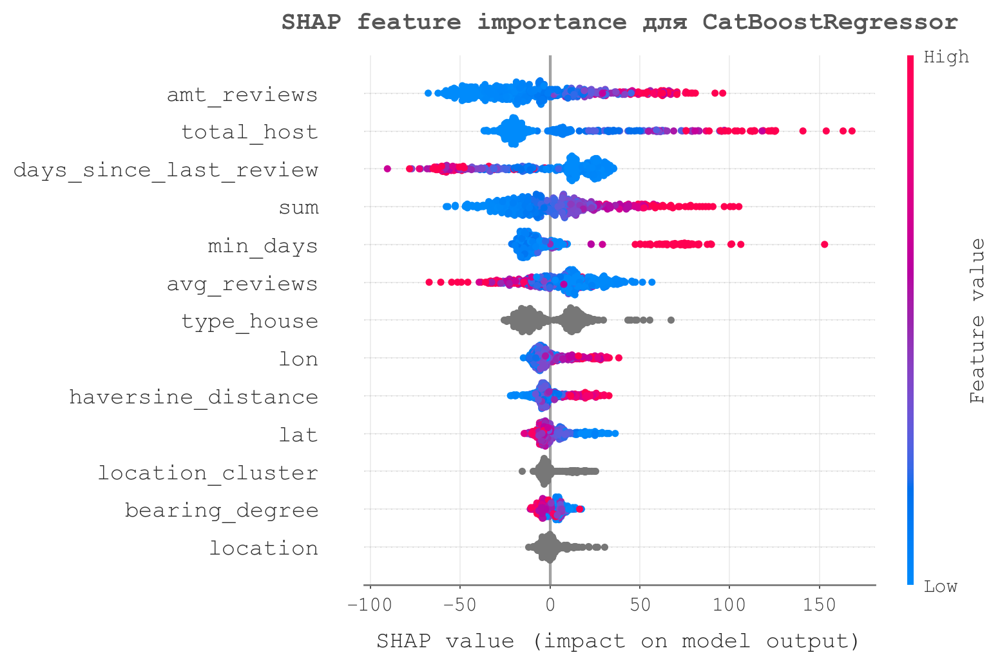

In [68]:
model = CatBoostRegressor(random_state=1, verbose=0)

model = model.fit(X_train, y_train,     
    cat_features=cat_features,
    eval_set=(X_valid, y_valid),
    early_stopping_rounds=50)

X_sample = X_train.sample(500, random_state=42)

explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_sample)

shap.summary_plot(shap_values, X_sample, max_display=20, 
                  plot_size=(8, 5), show=False)

plt.title("SHAP feature importance для CatBoostRegressor")
plt.show()

Значения SHAP слева от нуля соответствуют отрицательному вкладу признака в предсказание таргета, справа – положительному.

- наибольшее влияние у amt_reviews, total_host, days_since_last_review, sum, min_days и avg_reviews
- рост amt_reviews, total_host, sum и min_days в основном увеличивает предсказание модели
- рост days_since_last_review и avg_reviews чаще снижает предсказание
- географические признаки lon, haversine_distance, lat и bearing_degree имеют меньшее влияние
- вклад location_cluster и location меньше чем у признаками отзывов и активности объекта. Вероятно, часть информации о локации уже учитывается через координаты и расстояние, поэтому эти признаки не дают модели сильного дополнительного сигнала.

---

## Dataset for models

In [69]:
features, cat_features

(['location_cluster',
  'location',
  'lat',
  'lon',
  'type_house',
  'sum',
  'min_days',
  'amt_reviews',
  'avg_reviews',
  'total_host',
  'days_since_last_review',
  'bearing_degree',
  'haversine_distance'],
 ['location_cluster', 'location', 'type_house'])

In [70]:
X_full = X_full[features].copy()
X_test = X_test[features].copy()

assert X_full.shape[0] == y_full.shape[0]

# Utils

In [71]:
from category_encoders.cat_boost import CatBoostEncoder

In [72]:
from catboost import CatBoostRegressor


def run_model(model_class, params, X, y, X_test, cat_features, target_bin, n_splits=5):
    """
    Обучает модель с использованием Stratified KFold и возвращает предсказания.

    Parameters:
        model_class: класс модели 
        params: словарь гиперпараметров модели
        X: признаки train
        y: таргет train
        X_test: признаки test
        cat_features: список категориальных признаков для encoder
        target_bin: массив/серия для стратификации
        n_splits: количество фолдов

    Returns:
        oof_preds: out-of-fold предсказания для train
        test_preds: усредненные предсказания для test
        epistemic_uncertainty: variance предсказаний по фолдам
        train_preds_folds: предсказания train по каждому фолду
    """


    # === контейнеры ===============================

    # OOF предсказания для train: пустой контейнер
    oof_preds = np.zeros(len(X))
    
    # предсказания для test по фолдам
    test_preds_folds = []    

    # ~~~ для epistemic uncertainty ~~~
    train_preds_folds = []


    # === StratifiedKFold кросс-валидация ===========

    # инициализация стратифицированной KFold кросс-валидации
    # n_splits=5 - в валидацию уйдет 20% данных
    skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=1)


    # для каждого фолда ... разделить X на train\valid с сохранением распределения target (через target_bin)
    for fold, (train_rows, valid_rows) in enumerate(skf.split(X, target_bin)):
        
        # разделение данных из X на train и valid
        X_train = X.iloc[train_rows]
        X_valid = X.iloc[valid_rows]

        y_train = y.iloc[train_rows]
        y_valid = y.iloc[valid_rows]

      
        # === обучение моделей =============================

        # модель: инициализация / гиперпараметры    
        model = model_class(**params)


        # --- отдельный пайплайн для CatBoostRegressor ----
        
        # для CatBoost не нужно кодировать категории, 
        # так как он умеет работать с ними напрямую
        if issubclass(model_class, CatBoostRegressor):
            X_train_encoded = X_train.copy()
            X_valid_encoded = X_valid.copy()
            X_test_encoded = X_test.copy()

            # ~~~ для epistemic uncertainty ~~~
            X_full_encoded = X.copy()

            # обучение
            model.fit(X_train_encoded, y_train, 
                      eval_set=(X_valid_encoded, y_valid), 
                      cat_features=cat_features,
                      verbose=False, early_stopping_rounds=50)

        # --- отдельный пайплайн для LGBMRegressor ----
        elif issubclass(model_class, LGBMRegressor):
            X_train_encoded = X_train.copy()
            X_valid_encoded = X_valid.copy()
            X_test_encoded = X_test.copy()

            # ~~~ для epistemic uncertainty ~~~
            X_full_encoded = X.copy()

            for col in cat_features:
                X_train_encoded[col] = X_train_encoded[col].astype('category')
                X_valid_encoded[col] = X_valid_encoded[col].astype('category')
                X_test_encoded[col] = X_test_encoded[col].astype('category')
                X_full_encoded[col] = X_full_encoded[col].astype('category')

            # обучение
            model.fit(
                X_train_encoded, y_train,
                eval_set=[(X_valid_encoded, y_valid)])


        # --- для остальных моделей ----------------------
        else:
            encoder = CatBoostEncoder(cols=cat_features)

            # fit_transform заменяет категорию на число с учетом ее среднего таргета
            X_train_encoded = encoder.fit_transform(X_train, y_train)

            # transform преобразует категорию по уже обученному энкодеру    
            X_valid_encoded = encoder.transform(X_valid)
            X_test_encoded = encoder.transform(X_test)

            # ~~~ для epistemic uncertainty ~~~ transform всего X тем же энкодером
            X_full_encoded = encoder.transform(X)

            # модель: обучение на train
            model.fit(X_train_encoded, y_train)

        
        # === получение предсказаний =============================

        # предсказания для valid и test обученной моделью
        preds_valid_fold = model.predict(X_valid_encoded)
        preds_test_fold = model.predict(X_test_encoded)
        preds_full_fold = model.predict(X_full_encoded)

        # "честные" пресказания для обучения мета-модели
        # заполняем вектор OOF предсказаниями для текущего valid фолда
        oof_preds[valid_rows] = preds_valid_fold

        # сохраняем предсказания по фолдам
        test_preds_folds.append(preds_test_fold)        

        # ~~~ для epistemic uncertainty ~~~
        train_preds_folds.append(preds_full_fold)
        

    # === агрегация ==============================================

    # усреднение теста
    test_preds = np.mean(test_preds_folds, axis=0)    

    # ~~~ epistemic uncertainty ~~~
    train_preds_folds = np.array(train_preds_folds)  
    epistemic_uncertainty = train_preds_folds.var(axis=0)


    return oof_preds, test_preds, epistemic_uncertainty, train_preds_folds

# **Models**

## Model fit (1) – Baseline training

In [73]:
# Проверка данных перед обучением
print(f"y shape: {y_full.shape[0]}\n")

print(f"X shape {X_full[features].shape}, features: \n{X_full[features].columns.to_numpy()}\n")
print(f"X_test shape {X_test[features].shape}, features: \n{X_test[features].columns.to_numpy()}\n")

print(f"cat_features: {cat_features}\n")

assert X_full[features].shape[0] == y_full.shape[0]
assert X_full[features].shape[1] == X_test[features].shape[1]

y shape: 36671

X shape (36671, 13), features: 
['location_cluster' 'location' 'lat' 'lon' 'type_house' 'sum' 'min_days'
 'amt_reviews' 'avg_reviews' 'total_host' 'days_since_last_review'
 'bearing_degree' 'haversine_distance']

X_test shape (12224, 13), features: 
['location_cluster' 'location' 'lat' 'lon' 'type_house' 'sum' 'min_days'
 'amt_reviews' 'avg_reviews' 'total_host' 'days_since_last_review'
 'bearing_degree' 'haversine_distance']

cat_features: ['location_cluster', 'location', 'type_house']



In [74]:
# для сохранения MSE базовых моделей    
baseline_scores = {}

# общие данные для моделей
model_data = {
    'y': y_full,
    'target_bin': target_bin
}

In [75]:
RANDOM_STATE = 1
np.random.seed(RANDOM_STATE)

In [76]:
# 1. RandomForestRegressor

# признаки на удаление
rf_features = [f for f in X_full.columns 
               # эти признаки ухудшают качество предсказания:
               if f not in ['location', 'type_house', 'location_cluster']]

rf_params = {'random_state': RANDOM_STATE}

# данные для модели
model_data['X'] = X_full[rf_features]
model_data['X_test'] = X_test[rf_features]
model_data['cat_features'] = [f for f in cat_features if f in rf_features]

oof_rf, test_rf, eu_rf, preds_folds_rf = run_model(RandomForestRegressor, rf_params, **model_data)

baseline_scores['rf'] = mean_squared_error(y_full, oof_rf)
print(f"Random Forest baseline MSE: {baseline_scores['rf']:.2f}")

Random Forest baseline MSE: 10418.45


In [77]:
# 2. XGBRegressor

xgb_features = [f for f in features 
                # эти признаки ухудшают качество предсказания:
                if f not in ['location', 'type_house', 'location_cluster']]

xgb_params = {'random_state': RANDOM_STATE, 'n_estimators': 100}

model_data['X'] = X_full[xgb_features]
model_data['X_test'] = X_test[xgb_features]
model_data['cat_features'] = [f for f in cat_features if f in xgb_features]

oof_xgb, test_xgb, eu_xgb, preds_folds_xgb = run_model(XGBRegressor, xgb_params, **model_data)

baseline_scores['xgb'] = mean_squared_error(y_full, oof_xgb)
print(f"XGBoost baseline MSE: {baseline_scores['xgb']:.2f}")

XGBoost baseline MSE: 10720.45


In [78]:
# 3. LGBMRegressor

lgbm_features = [f for f in features 
                 # эти признаки ухудшают качество предсказания:
                if f not in ['location', 'type_house', 'location_cluster']]

lgbm_params = {'random_state': RANDOM_STATE, 'n_estimators': 100, 'verbosity':0}

model_data['X'] = X_full[lgbm_features]
model_data['X_test'] = X_test[lgbm_features]
model_data['cat_features'] = [f for f in cat_features if f in lgbm_features]

oof_lgbm, test_lgbm, eu_lgbm, preds_folds_lgbm = run_model(LGBMRegressor, lgbm_params, **model_data)

baseline_scores['lgbm'] = mean_squared_error(y_full, oof_lgbm)
print(f"LightGBM baseline MSE: {baseline_scores['lgbm']:.2f}")

LightGBM baseline MSE: 10556.91


In [79]:
# 4. CatBoostRegressor

cb_features = features
cb_params = {'random_state': RANDOM_STATE, 'iterations': 100, 'verbose': 0}

model_data['X'] = X_full[cb_features]
model_data['X_test'] = X_test[cb_features]
model_data['cat_features'] = [f for f in cat_features if f in cb_features]

oof_cb, test_cb, eu_cb, preds_folds_cb = run_model(CatBoostRegressor, cb_params, **model_data)

baseline_scores['cb'] = mean_squared_error(y_full, oof_cb)
print(f"CatBoost baseline MSE: {baseline_scores['cb']:.2f}")

CatBoost baseline MSE: 10372.88


In [80]:
# 5. LinearRegression

lr_features = features
lr_params = {}

model_data['X'] = X_full[lr_features]
model_data['X_test'] = X_test[lr_features]
model_data['cat_features'] = [f for f in cat_features if f in lr_features]

oof_lr, test_lr, eu_lr, preds_folds_lr = run_model(LinearRegression, lr_params, **model_data)

baseline_scores['lr'] = mean_squared_error(y_full, oof_lr)
print(f"LinearRegression baseline MSE: {baseline_scores['lr']:.2f}")

LinearRegression baseline MSE: 14001.67


In [81]:
(pd.DataFrame(baseline_scores, index=['MSE']).T.sort_values('MSE'))

,MSE
cb,10372.877867
rf,10418.453827
lgbm,10556.905247
xgb,10720.453723
lr,14001.665032


Лучший результат среди базовых моделей у CatBoost (MSE = 10372.88), близко к нему RandomForest (MSE = 10418.45). LinearRegression заметно хуже остальных. Зависимость в данных лучше описывается нелинейными моделями.

---

## Hyperparameters tuning

**Гиперпараметры моделей**

Скорость / качество:
- n_estimators: количество деревьев в ансамбле. Больше – лучше обучение, но риск переобучения, меньше – недообучение (обычно: 300–1000)
- learning_rate: контролирует вес нового дерева при добавлении его в ансамбль (меньше lr – больше n_estimators)

Контроль сложности:
- max_depth: ограничивает глубину каждого дерева, предотвращая переобучение.
- num_leaves: максимальное количество листьев в дереве. Чем больше значение, тем сложнее модель и тем выше риск переобучения
- min_samples_leaf / min_child_samples: минимальное количество объектов, которые должны находиться в каждом листе дерева

Борьба с переобучением:
- subsample: доля объектов, используемых при построении каждого дерева. Значения < 1 добавляют случайность и снижают переобучение.
- colsample_bytree: доля признаков, используемых при построении дерева. Снижает корреляцию между деревьями и улучшает обобщающую способность модели.
- reg_alpha (L1): штраф за веса, зануляет слабые признаки, делает модель проще
- reg_lambda (L2): сглаживает веса, снижает variance

In [82]:
import optuna
import xgboost as xgb

optuna.logging.set_verbosity(optuna.logging.ERROR)
xgb.set_config(verbosity=0)

In [83]:
def objective(trial, model_class, features, cat_features, param_fn):

    params = param_fn(trial)

    oof, _, _, _ = run_model(
        model_class,
        params,
        X=X_full[features],
        y=y_full,
        X_test=X_test[features],
        cat_features=[f for f in cat_features if f in features],
        target_bin=target_bin,
        n_splits=3
    )

    return mean_squared_error(y_full, oof)

В ноутбуке для скорости Optuna запускается в демонстрационном режиме с n_trials=5 и маленьким пространством поиска. Финальные параметры (manual_params) для моделей были получены заранее в отдельном запуске с более подробной сеткой и большим числом trials. Дальше каждой модели сравниваю два набора параметров:

- optuna_params — параметры, полученные в быстром демонстрационном запуске Optuna;
- manual_params — заранее сохраненные параметры из более полного подбора.

После обучения выбирается набор параметров с меньшим MSE на OOF-предсказаниях. 

In [84]:
def lgbm_params(trial):
    return {
        'n_estimators': trial.suggest_int('n_estimators', 100, 250),
        'learning_rate': trial.suggest_float('learning_rate', 0.03, 0.08),
        'num_leaves': trial.suggest_int('num_leaves', 20, 60),
        'random_state': 42,
        'verbosity': -1
    }

study_lgbm = optuna.create_study(direction='minimize')

study_lgbm.optimize(
    lambda trial: objective(
        trial,
        model_class=LGBMRegressor,
        features=lgbm_features,
        cat_features=cat_features,
        param_fn=lgbm_params
    ),
    n_trials=5,
    show_progress_bar=True
)

print(f"Best LGBM params:")
print(study_lgbm.best_params)

  0%|          | 0/5 [00:00<?, ?it/s]

Best LGBM params:
{'n_estimators': 242, 'learning_rate': 0.06193721713623029, 'num_leaves': 42}


In [85]:
# альтернативные гиперпараметры, подобраны по одному из испытаний с лучшим MSE

lgbm_manual_params = {
    'n_estimators': 600, 
    'learning_rate': 0.02, 
    'num_leaves': 130, 
    'max_depth': 10, 
    'min_child_samples': 20, 
    'subsample': 0.8, 
    'colsample_bytree': 0.7, 
    'reg_alpha': 1.0, 
    'reg_lambda': 1.5
    }

In [86]:
def xgb_params(trial):
    return {
        'n_estimators': trial.suggest_int('n_estimators', 100, 250),
        'learning_rate': trial.suggest_float('learning_rate', 0.03, 0.08),
        'max_depth': trial.suggest_int('max_depth', 3, 5),
        'random_state': 42,
        'verbosity': 0,
    }

study_xgb = optuna.create_study(direction='minimize')

study_xgb.optimize(
    lambda trial: objective(
        trial,
        model_class=XGBRegressor,
        features=xgb_features,
        cat_features=cat_features,
        param_fn=xgb_params
    ),
    n_trials=5,
    show_progress_bar=True
)

print("Best XGB params:")
print(study_xgb.best_params)

  0%|          | 0/5 [00:00<?, ?it/s]

Best XGB params:
{'n_estimators': 239, 'learning_rate': 0.03320660763175265, 'max_depth': 5}


In [87]:
# альтернативные гиперпараметры, подобраны по одному из испытаний с лучшим MSE

xgb_manual_params = {
    'n_estimators': 700, 
    'learning_rate': 0.02, 
    'max_depth': 8, 
    'min_child_weight': 4, 
    'subsample': 0.9, 
    'colsample_bytree': 0.9, 
    'gamma': 1.5, 
    'reg_alpha': 2.0, 
    'reg_lambda': 1.0
    }

In [88]:
def cb_params(trial):
    return {
        'iterations': trial.suggest_int('iterations', 100, 200),
        'learning_rate': trial.suggest_float('learning_rate', 0.03, 0.08),
        'depth': trial.suggest_int('depth', 4, 6),
        'random_state': 42,
        'verbose': 0
    }

study_cb = optuna.create_study(direction='minimize')

study_cb.optimize(
    lambda trial: objective(
        trial,
        model_class=CatBoostRegressor,
        features=cb_features,
        cat_features=cat_features,
        param_fn=cb_params
    ),
    n_trials=5,
    show_progress_bar=True
)

print("Best CB params:")
print(study_cb.best_params)

  0%|          | 0/5 [00:00<?, ?it/s]

Best CB params:
{'iterations': 174, 'learning_rate': 0.05806485679249554, 'depth': 5}


In [89]:
# альтернативные гиперпараметры, подобраны по одному из испытаний с лучшим MSE

cb_manual_params = {
    'iterations': 800, 
    'learning_rate': 0.06, 
    'depth': 8, 
    'l2_leaf_reg': 2.0, 
    'bagging_temperature': 0.4, 
    'random_strength': 0.5, 
    'border_count': 96
    }

## Model fit (2) – Final model training
Финальное обучение модели после подбора гиперпараметров

In [90]:
pd.DataFrame(list(baseline_scores.items()), columns=['Model', 'MSE'])

,Model,MSE
0,rf,10418.453827
1,xgb,10720.453723
2,lgbm,10556.905247
3,cb,10372.877867
4,lr,14001.665032


In [91]:
final_scores = baseline_scores.copy()

In [92]:
# 2. XGBRegressor

print(f"{'XGBoost MSE before tuning:':<33}{baseline_scores['xgb']:.2f}")

model_data['X'] = X_full[xgb_features]
model_data['X_test'] = X_test[xgb_features]
model_data['cat_features'] = [f for f in cat_features if f in xgb_features]

# испытание для проверки лучшего набора гиперпараметров
xgb_param_sets = {
    'optuna_xgb_params': {**study_xgb.best_params, 
                          'verbosity': 0, 
                          'random_state': RANDOM_STATE},
    'xgb_manual_params': {**xgb_manual_params, 
                         'verbosity': 0, 
                         'random_state': RANDOM_STATE},
}

xgb_results = {}

for name, params in xgb_param_sets.items():
    oof_tmp, test_tmp, eu_tmp, preds_folds_tmp = run_model(
        XGBRegressor,
        params,
        **model_data
    )

    mse_tmp = mean_squared_error(y_full, oof_tmp)

    xgb_results[name] = {
        'mse': mse_tmp,
        'oof': oof_tmp,
        'test': test_tmp,
        'eu': eu_tmp,
        'preds_folds': preds_folds_tmp,
        'params': params,
    }

    print(f"{'XGBoost MSE (' + name + '):':<33}{mse_tmp:.2f}")

best_xgb_name = min(xgb_results, key=lambda name: xgb_results[name]['mse'])
best_xgb = xgb_results[best_xgb_name]

# сохранение лучших предсказаний
oof_xgb = best_xgb['oof']
test_xgb = best_xgb['test']
eu_xgb = best_xgb['eu']
preds_folds_xgb = best_xgb['preds_folds']

final_scores['xgb'] = best_xgb['mse']

print(f"\n{'Best XGBoost params set:':<33}{best_xgb_name}")
print(f"{'XGBoost MSE final scores:':<33}{final_scores['xgb']:.2f}")


XGBoost MSE before tuning:       10720.45
XGBoost MSE (optuna_xgb_params): 10668.86
XGBoost MSE (xgb_manual_params): 10211.01

Best XGBoost params set:         xgb_manual_params
XGBoost MSE final scores:        10211.01


In [93]:
# LightGBMRegressor

print(f"{'LightGBM MSE before tuning:':<36}{baseline_scores['lgbm']:.2f}")

# испытание для проверки лучшего набора гиперпараметров
lgbm_param_sets = {
    'optuna_lgbm_params': {**study_lgbm.best_params, 
                          'verbosity': -1,
                          'random_state': RANDOM_STATE},
    'lgbm_manual_params': {**lgbm_manual_params, 
                          'verbosity': -1,
                          'random_state': RANDOM_STATE},
}

model_data['X'] = X_full[lgbm_features]
model_data['X_test'] = X_test[lgbm_features]
model_data['cat_features'] = [f for f in cat_features if f in lgbm_features]

lgbm_results = {}

for name, params in lgbm_param_sets.items():
    oof_tmp, test_tmp, eu_tmp, preds_folds_tmp = run_model(
        LGBMRegressor,
        params,
        **model_data
    )

    mse_tmp = mean_squared_error(y_full, oof_tmp)

    lgbm_results[name] = {
        'mse': mse_tmp,
        'oof': oof_tmp,
        'test': test_tmp,
        'eu': eu_tmp,
        'preds_folds': preds_folds_tmp,
        'params': params,
    }

    print(f"{'LightGBM MSE (' + name + '):':<36}{mse_tmp:.2f}")

best_lgbm_name = min(lgbm_results, key=lambda name: lgbm_results[name]['mse'])
best_lgbm = lgbm_results[best_lgbm_name]

# сохранение лучших предсказаний
oof_lgbm = best_lgbm['oof']
test_lgbm = best_lgbm['test']
eu_lgbm = best_lgbm['eu']
preds_folds_lgbm = best_lgbm['preds_folds']

final_scores['lgbm'] = best_lgbm['mse']

print(f"\n{'Best LightGBM params set:':<36}{best_lgbm_name}")
print(f"{'LightGBM MSE final scores:':<36}{final_scores['lgbm']:.2f}")


LightGBM MSE before tuning:         10556.91
LightGBM MSE (optuna_lgbm_params):  10436.95
LightGBM MSE (lgbm_manual_params):  10282.39

Best LightGBM params set:           lgbm_manual_params
LightGBM MSE final scores:          10282.39


In [94]:
# 4. CatBoostRegressor

print(f"{'CatBoost MSE before tuning:':<35}{baseline_scores['cb']:.2f}")

model_data['X'] = X_full[cb_features]
model_data['X_test'] = X_test[cb_features]
model_data['cat_features'] = [f for f in cat_features if f in cb_features]

# испытание для проверки лучшего набора гиперпараметров
cb_param_sets = {
    'optuna_cb_params': {**study_cb.best_params, 
                         'verbose': 0,
                         'random_seed': RANDOM_STATE},
    'cb_manual_params': {**cb_manual_params, 
                         'verbose': 0,
                         'random_seed': RANDOM_STATE},
}

cb_results = {}

for name, params in cb_param_sets.items():
    oof_tmp, test_tmp, eu_tmp, preds_folds_tmp = run_model(
        CatBoostRegressor,
        params,
        **model_data
    )

    mse_tmp = mean_squared_error(y_full, oof_tmp)

    cb_results[name] = {
        'mse': mse_tmp,
        'oof': oof_tmp,
        'test': test_tmp,
        'eu': eu_tmp,
        'preds_folds': preds_folds_tmp,
        'params': params,
    }

    print(f"{'CatBoost MSE (' + name + '):':<35}{mse_tmp:.2f}")

best_cb_name = min(cb_results, key=lambda name: cb_results[name]['mse'])
best_cb = cb_results[best_cb_name]

# сохранение лучших предсказаний
oof_cb = best_cb['oof']
test_cb = best_cb['test']
eu_cb = best_cb['eu']
preds_folds_cb = best_cb['preds_folds']

final_scores['cb'] = best_cb['mse']

print(f"\n{'Best CatBoost params set:':<35}{best_cb_name}")
print(f"{'CatBoost MSE final scores:':<35}{final_scores['cb']:.2f}")


CatBoost MSE before tuning:        10372.88
CatBoost MSE (optuna_cb_params):   10782.77
CatBoost MSE (cb_manual_params):   10096.42

Best CatBoost params set:          cb_manual_params
CatBoost MSE final scores:         10096.42


<p>&nbsp;</p>

---

# Ensemble / Stacking

In [95]:
# стекинг
oof_matrix = pd.DataFrame({
    "lr": oof_lr,
    "rf": oof_rf,
    "lgbm": oof_lgbm,
    "cb": oof_cb,
    "xgb": oof_xgb
})

test_matrix = pd.DataFrame({
    "lr": test_lr,
    "rf": test_rf,
    "lgbm": test_lgbm,
    "cb": test_cb,
    "xgb": test_xgb
})

### CatBoost meta-model

In [96]:
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# контейнеры
oof_meta = np.zeros(len(oof_matrix))
test_preds_folds_meta = []


# StratifiedKFold кросс-валидация 
for fold, (train_rows, valid_rows) in enumerate(skf.split(oof_matrix, target_bin)):

    # разделение данных из oof_matrix на train и valid
    X_train_meta = oof_matrix.iloc[train_rows]
    X_valid_meta = oof_matrix.iloc[valid_rows]

    y_train_meta = y_full.iloc[train_rows]
    y_valid_meta = y_full.iloc[valid_rows]

    model_meta = CatBoostRegressor(
        depth=4,
        learning_rate=0.03,
        iterations=400,
        l2_leaf_reg=5,
        verbose=0,
        random_seed=RANDOM_STATE,
    )

    model_meta.fit(X_train_meta, y_train_meta)

    # предсказания
    preds_valid_fold_meta = model_meta.predict(X_valid_meta)
    preds_test_fold_meta = model_meta.predict(test_matrix)

    oof_meta[valid_rows] = preds_valid_fold_meta
    test_preds_folds_meta.append(preds_test_fold_meta)

# усреднение теста
test_meta_preds = np.mean(test_preds_folds_meta, axis=0)

# метрика
final_scores['meta'] = mean_squared_error(y_full, oof_meta)

print(f"Stacking MSE (CatBoost meta): {final_scores['meta']:.4f}")
print(f"Min preds: {test_meta_preds.min():.2f}")
print(f"Max preds: {test_meta_preds.max():.2f}")

pd.DataFrame(final_scores, index=['MSE']).T.sort_values('MSE')

Stacking MSE (CatBoost meta): 9902.8880
Min preds: 2.46
Max preds: 343.20


,MSE
meta,9902.887953
cb,10096.422913
xgb,10211.012661
lgbm,10282.393525
rf,10418.453827
lr,14001.665032


In [97]:
# # submission save to file
# submission = pd.read_csv('data/sample_submition.csv')

# submission['prediction'] = test_meta_preds
# submission.to_csv('submission_cb_meta(1).csv', index=False)

# assert submission.shape[0] == len(test_xgb)

---

# Uncertainty

### Эпистемическая неопределенность

Эпистемическая неопределенность отражает неопределенность модели, связанную с недостатком информации о данных. В данном случае это мера согласия моделей ансамбля в их предсказаниях: чем сильнее различаются предсказания базовых моделей, тем выше эпистемическая неопределенность. 

Она рассчитывается как дисперсия предсказаний базовых моделей:

$\text{epistemic}_i = \text{var}(\text{fold predictions}_i)\ \ \ \ $ или $\ \ \ \ \text{epistemic}_i^{base} = \frac{1}{K}\sum_{k=1}^{K}(\mu_{ik}^{fold} - \bar{\mu}_i^{fold})^2$



Для мета-модели эпистемическая неопределенность оценивается как разброс предсказаний разных базовых моделей. 

$\text{epistemic}_i^{meta} = \text{var}(\text{base model predictions}_i)\ \ \ \ $  или 
$\ \ \ \ \text{epistemic}_i^{meta} = \frac{1}{N_{base}}\sum_{j=1}^{N_{base}}(\mu_{ij}^{base} - \bar{\mu}_i^{base})^2$

Эпистемическую неопределенность можно уменьшить, если добавить больше обучающих примеров в ту область, где модель не уверена.


In [98]:
# предсказания базовых моделей
preds_matrix = np.vstack([
    oof_lr,
    oof_rf,
    oof_lgbm,
    oof_cb,
    oof_xgb
]).T

# эпистемическая неопределенность: variance предсказаний базовых моделей
epistemic_uncertainty = preds_matrix.var(axis=1)

df_uncertainty = pd.DataFrame({
    'y_true': y_full,
    'lr': oof_lr,
    'rf': oof_rf,
    'lgbm': oof_lgbm,
    'cb': oof_cb,
    'xgb': oof_xgb,
    'meta': oof_meta,
    'epistemic': epistemic_uncertainty
})

# эпистемическая неопределенность в единицах таргета
df_uncertainty['model_disagreement'] = preds_matrix.std(axis=1)

# абсолютная ошибка мета-модели
df_uncertainty['abs_error'] = np.abs(
    df_uncertainty['y_true'] - df_uncertainty['meta']
)

display(df_uncertainty.describe())

,y_true,lr,rf,lgbm,cb,xgb,meta,epistemic,model_disagreement,abs_error
count,36671.000000,36671.000000,36671.000000,36671.000000,36671.000000,36671.000000,36671.000000,36671.000000,36671.000000,36671.000000
mean,112.766628,112.297259,115.154243,112.727235,112.759111,112.845027,112.761766,787.056015,23.731660,74.091320
std,131.583284,57.850414,85.346884,83.644536,84.850343,85.069654,86.056980,1511.261230,14.962300,66.434062
min,0.000000,-120.016393,0.000000,-21.714630,-55.521621,-22.872887,1.740118,0.397026,0.630100,0.013120
25%,0.000000,84.113386,40.380000,39.743985,39.993672,38.480719,36.943802,191.300174,13.831131,21.743977
50%,45.000000,106.826753,104.900000,101.289894,102.591558,99.658318,100.764184,427.672468,20.680243,54.722418
75%,227.000000,137.114818,173.250000,169.542120,169.979502,170.848984,169.743275,864.543494,29.403120,108.582930
max,365.000000,1133.356909,363.200000,397.433619,383.257708,383.990631,343.875436,110816.352771,332.890902,362.776700


Среднее значение таргета 112.77, и средние предсказания большинства моделей близки к этому уровню. 

LinearRegression заметно отличается от остальных моделей: у нее меньше разброс предсказаний (std) и есть сильные выбросы, включая отрицательные значения (до -120) и максимум выше 1100. LGBM, CatBoost и XGBoost тоже встречаются значения ниже 0 и выше 365.

Мета-модель сглаживает предсказания базовых моделей и предсказывает таргет в валидном диапазоне [0, 365].

Средняя эпистемическая неопределенность равна 874 (model disagreement в днях: 25 дней). При этом максимум несогласия моделей в 327 дней показывает, что для части объектов модели сильно расходятся в предсказаниях.

In [99]:
# объекты с самой высокой EU
print("Объекты с самой высокой эпистемической неопределенностью")
display(df_uncertainty.sort_values('epistemic', ascending=False).round(2).head(10))

# объекты с самой низкой EU
print("\nОбъекты с самой низкой эпистемической неопределенностью")
display(df_uncertainty.sort_values('epistemic').round(2).head(10))

Объекты с самой высокой эпистемической неопределенностью


,y_true,lr,rf,lgbm,cb,xgb,meta,epistemic,model_disagreement,abs_error
10319,365,1133.36,307.77,306.92,298.87,291.49,294.90,110816.35,332.89,70.10
15846,362,954.89,193.26,248.23,272.19,183.66,198.88,86489.23,294.09,163.12
3928,249,925.12,256.31,204.63,194.59,198.91,238.36,81496.09,285.48,10.64
1413,365,964.77,294.72,293.53,261.18,317.93,298.47,72779.82,269.78,66.53
3310,42,884.91,261.74,272.14,248.92,289.53,276.16,61052.86,247.09,234.16
28942,0,663.40,198.28,180.67,85.86,193.99,108.03,41483.51,203.68,108.03
1597,0,588.88,155.28,217.58,68.94,145.31,78.80,33501.35,183.03,78.80
1084,83,606.07,151.46,220.32,222.38,167.61,185.47,28429.85,168.61,102.47
34982,0,483.62,170.00,145.60,87.48,99.55,102.98,21402.31,146.30,102.98
31847,83,643.83,257.79,282.60,296.10,354.62,287.76,20173.28,142.03,204.76



Объекты с самой низкой эпистемической неопределенностью


,y_true,lr,rf,lgbm,cb,xgb,meta,epistemic,model_disagreement,abs_error
17185,0,1.11,0.00,-0.08,-0.73,0.62,2.43,0.40,0.63,2.43
24052,0,-1.64,0.00,-0.24,-2.03,-1.73,2.30,0.70,0.84,2.30
11240,0,-2.16,0.00,0.27,-1.15,-0.38,3.06,0.77,0.88,3.06
13339,0,-0.38,1.57,-0.39,1.64,0.41,2.46,0.80,0.89,2.46
1774,0,-0.72,0.00,1.63,1.21,1.38,2.44,0.82,0.90,2.44
23183,0,13.96,12.68,11.64,12.17,10.67,9.38,1.20,1.10,9.38
10301,52,103.61,104.31,103.62,106.58,103.13,105.20,1.50,1.22,53.20
2718,113,94.06,94.95,93.70,97.36,94.68,88.14,1.65,1.28,24.86
33797,309,153.50,155.28,154.28,156.84,156.77,155.52,1.76,1.33,153.48
262,0,3.60,1.88,3.14,2.50,5.85,3.89,1.85,1.36,3.89


Для объектов **с самой высокой эпистемической неопределенностью** линейная регрессия часто дает сильно выбивающиеся предсказания. Модели не согласны между собой > высокая вариативность предсказаний > высокая эпистемическая неопределенность. В этом датасете высокую неопределенность дали объекты как с высоким, так и средним и низким значением таргета.

Для объектов **с минимальной эпистемической неопределенностью** модели дают почти одинаковые предсказания. Модели согласны между собой > вариативность низкая > низкая эпистемическая неопределенность. Но при этом модели могут согласованно ошибаться. В этом датасете в эту категорию попали в основном объекты с нулевым или небольшим таргетом. 

Низкая эпистемическая неопределенность при высокой фактической ошибке (abs_error) говорит о высокой алеаторной неопределенности: модели уверены в предсказаниях, но данные содержат шум или структуру, которые модели не уловили. 

In [100]:
# объекты с самой высокой фактической ошибкой
print("Объекты с самой высокой фактической ошибкой")
display(df_uncertainty.sort_values('abs_error').round(2).tail(10))

Объекты с самой высокой фактической ошибкой


,y_true,lr,rf,lgbm,cb,xgb,meta,epistemic,model_disagreement,abs_error
17949,365,58.07,9.82,10.75,16.19,20.14,13.27,321.56,17.93,351.73
5188,363,2.23,16.20,7.17,23.61,-1.30,10.91,83.75,9.15,352.09
9364,364,62.64,23.97,10.71,10.41,10.75,11.15,405.93,20.15,352.85
16322,364,13.96,6.30,20.34,8.69,17.28,9.84,27.23,5.22,354.16
10632,363,40.95,6.85,2.84,14.25,9.10,8.21,184.60,13.59,354.79
11404,364,47.88,0.06,10.84,6.16,10.86,7.32,283.38,16.83,356.68
29803,363,66.27,1.66,1.48,-12.85,-0.97,4.62,788.99,28.09,358.38
9342,365,48.90,5.50,-8.75,6.56,-10.54,5.11,460.92,21.47,359.89
11798,365,32.11,3.47,0.45,-9.71,-1.55,2.55,203.42,14.26,362.45
1832,365,5.26,0.00,-7.00,-1.88,-4.11,2.22,17.03,4.13,362.78


Объекты с самой высокой фактической ошибкой в основном имеют таргет около максимального значения 363-365, но все модели предсказывают для них очень низкие значения.

В большинстве случаев модели ошибаются согласованно, поэтому высокая ошибка не всегда связана с высокой эпистемической неопределенностью.

Например, для объекта 1832 таргет равен 365, а мета-модель предсказала 2.45. При этом model_disagreement всего 2.92, то есть модели почти согласны между собой, но все ошибаются в одну сторону. Это указывает на недостаток признаков: модели уверенно дают неправильный прогноз, потому что в данных есть шум или неучтенные факторы, объясняющие высокий таргет.

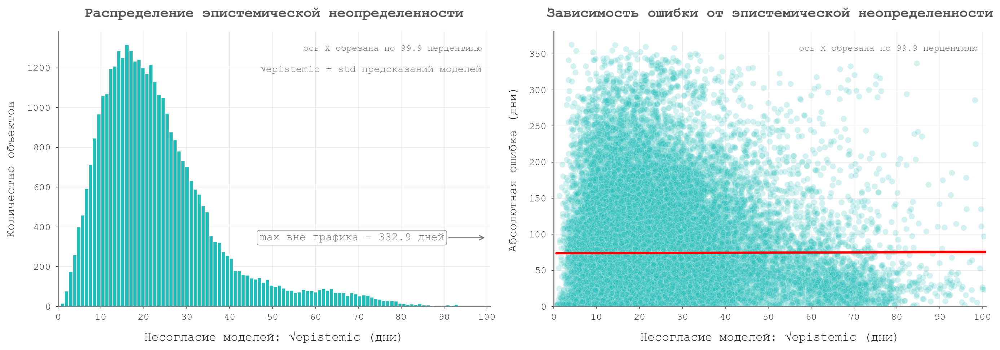

In [101]:
x_uncertainty = df_uncertainty['model_disagreement']
y_error = df_uncertainty['abs_error']

x_limit = df_uncertainty['model_disagreement'].quantile(0.999)

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# --- histplot: распределение несогласия моделей

axes[0].hist(x_uncertainty, bins='auto', edgecolor='white')

axes[0].text(0.98, 0.95, "ось X обрезана по 99.9 перцентилю",
    transform=axes[0].transAxes,
    ha='right', va='top', fontsize=9, color="#777777")

axes[0].text(0.98, 0.88, "√epistemic = std предсказаний моделей",
    transform=axes[0].transAxes,
    ha='right', va='top', fontsize=10, color="#777777")

max_disagreement = df_uncertainty['model_disagreement'].max()

axes[0].annotate(
    f"max вне графика = {max_disagreement:.1f} дней",
    xy=(100, axes[0].get_ylim()[1] * 0.25),
    xytext=(90, axes[0].get_ylim()[1] * 0.25),
    arrowprops=dict(arrowstyle='->', color="#777777", lw=1),
    fontsize=11, color="#777777",
    ha='right', va='center',
    bbox=dict(boxstyle='round,pad=0.25', facecolor='white', 
              edgecolor="#777777", lw=0.5, alpha=0.9),

)

axes[0].set_xlabel("Несогласие моделей: √epistemic (дни)")
axes[0].set_ylabel("Количество объектов")
axes[0].set_title("Распределение эпистемической неопределенности")

axes[0].set_xlim(0, x_limit)
axes[0].set_xticks(np.arange(0, 101, 10))
axes[0].grid(which='major', axis='x', alpha=0.3)


# --- scatterplot: зависимость неопределенности и ошибки

sns.scatterplot(x=x_uncertainty, y=y_error, ax=axes[1], alpha=0.2)

# regplot
sns.regplot(x=x_uncertainty, y=y_error, scatter=False,
    color='red', ax=axes[1])

axes[1].text(0.98, 0.95, "ось X обрезана по 99.9 перцентилю",
    transform=axes[1].transAxes,
    ha='right', va='top', fontsize=9, color="#777777")

axes[1].set_xlabel("Несогласие моделей: √epistemic (дни)")
axes[1].set_ylabel("Абсолютная ошибка (дни)")
axes[1].set_title("Зависимость ошибки от эпистемической неопределенности")

axes[1].set_xlim(0, x_limit)
axes[1].set_ylim(bottom=0)
axes[1].set_xticks(np.arange(0, 101, 10))
axes[1].grid(which='major', axis='x', alpha=0.3)

plt.tight_layout()
plt.show()


1. **histplot**: основная часть значений эпистемической неопределенности сосредоточена примерно в диапазоне 10-50 дней. Распределение имеет длинный правый хвост, на графике он обрезан по 99.9 перцентилю.

2. **scatterplot**: линия тренда почти горизонтальная, не видно выраженной линейной зависимости между эпистемической неопределенностью и ошибкой. Модели могут сильно расходиться в предсказаниях, но это не всегда приводит к ошибке, а могут совпадать в предсказаниях и ошибаться.

In [102]:
# перевод эпистемической неопределенности в дни

eu_cb_days = np.sqrt(eu_cb)
eu_lgbm_days = np.sqrt(eu_lgbm)
eu_xgb_days = np.sqrt(eu_xgb)
eu_rf_days = np.sqrt(eu_rf)
eu_lr_days = np.sqrt(eu_lr)

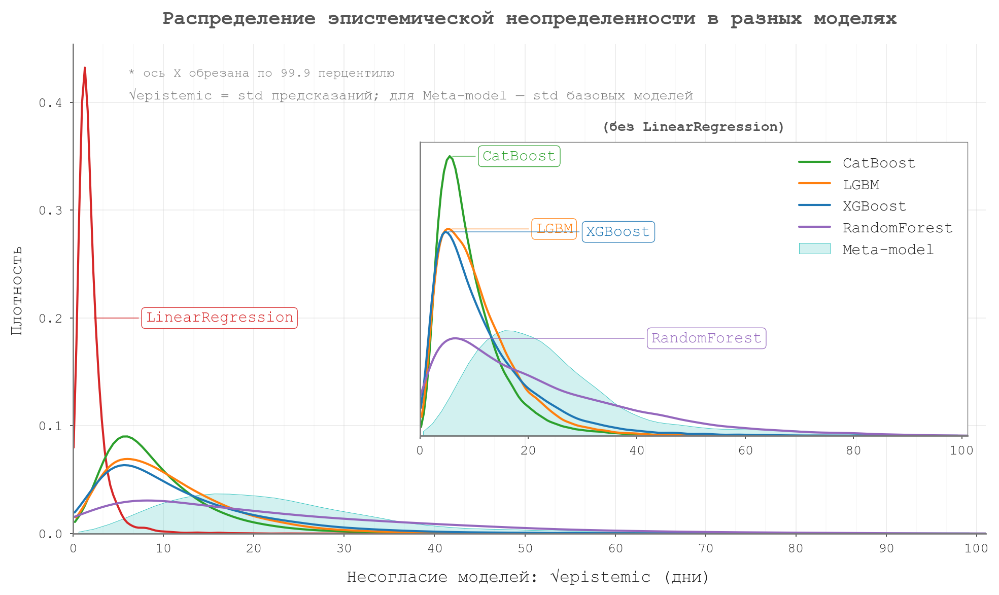

In [103]:
from scipy.stats import gaussian_kde

# функция для нахождения пика KDE
def get_peak(data):
    kde = gaussian_kde(data)
    x = np.linspace(min(data), max(data), 200)
    y = kde(x)
    return x[np.argmax(y)], np.max(y)

# цвета
colors = plt.get_cmap('tab10').colors

# все модели
models = {
    'LinearRegression': (eu_lr_days, colors[3]),
    'CatBoost': (eu_cb_days, colors[2]),
    'LGBM': (eu_lgbm_days, colors[1]),
    'XGBoost': (eu_xgb_days, colors[0]),
    'RandomForest': (eu_rf_days, colors[4]),
}

# модели для inset
inset_keys = ['CatBoost', 'LGBM', 'XGBoost', 'RandomForest']

model_disagreement = df_uncertainty['model_disagreement']

# ==========================

plt.figure(figsize=(10, 6))
ax = plt.gca()

# основной график
for name, (data, color) in models.items():
    sns.kdeplot(data, bw_adjust=2, color=color, cut=0, ax=ax)

# meta-model
sns.kdeplot(model_disagreement, color=box, cut=0, 
    fill=True, alpha=0.2, linewidth=0.3, ax=ax)


ax.text(0.06, 0.95, "* ось X обрезана по 99.9 перцентилю",
    transform=ax.transAxes,
    ha='left', va='top', fontsize=9, color="#777777")

ax.text(0.06, 0.91, "√epistemic = std предсказаний; для Meta-model — std базовых моделей",
    transform=ax.transAxes,
    ha='left', va='top', fontsize=10, color="#777777")


# оформление
ax.set_title("Распределение эпистемической неопределенности в разных моделях")
ax.set_xlabel("Несогласие моделей: √epistemic (дни)")
ax.set_ylabel("Плотность")

ax.set_xlim(0, 101)
ax.set_xticks(np.arange(0, 101, 10))      
ax.set_xticks(np.arange(0, 101, 3.3333), minor=True)  

ax.grid(which='major', axis='x', alpha=0.3)
ax.grid(which='minor', axis='x', alpha=0.1)

# === INSET ================
axins = ax.inset_axes([0.38, 0.2, 0.6, 0.6])

shift=6

for name in inset_keys:
    data, color = models[name]
    
    # линия kde
    sns.kdeplot(data, color=color, cut=0, ax=axins, label=name)

    # пик kde
    x_peak, y_peak = get_peak(data)

    # аннотация
    axins.annotate(name,
    xy=(x_peak, y_peak),
    xytext=(x_peak+shift, y_peak), 
    color=color, fontsize=11, va='center',
    arrowprops=dict(arrowstyle='-', color=color, lw=0.5, ),
    bbox=dict(boxstyle='round,pad=0.25', facecolor='white', 
              edgecolor=color, lw=0.5, alpha=0.9),)
    
    shift+=10

# meta-model в inset
sns.kdeplot(model_disagreement, color=box, label='Meta-model',
    fill=True, cut=0, alpha=0.2, linewidth=0.3, ax=axins)


# аннотация
ax.annotate('LinearRegression',
    xy=(2, 0.2),
    xytext=(8, 0.2), 
    zorder=10,
    color=colors[3], fontsize=11, va='center', ha='left',
    arrowprops=dict(arrowstyle='-', color=colors[3], lw=0.5, ),
    bbox=dict(boxstyle='round,pad=0.25', facecolor='white', edgecolor=colors[3], lw=0.5, alpha=0.9),
)


# оформление inset
axins.legend(loc='upper right')
axins.set_title("(без LinearRegression)", fontsize=10, loc='center', pad=8)
axins.set_xlim(0, 101)
axins.set_ylim(bottom=0)
axins.set_yticks([])
axins.set_xlabel('')
axins.set_ylabel('')
axins.grid(False)

axins.patch.set_facecolor('white')
axins.patch.set_alpha(1)
axins.patch.set_edgecolor("#777777")
axins.patch.set_linewidth(0.5)

plt.tight_layout()
plt.show()

**Сравнение эпистемической неопределенности в разных моделях**

Линейная регрессия имеет очень узкое распределение с пиком около нуля. Eе предсказания по фолдам почти не различаются. 

У бустинговых моделей (CatBoost, LGBM, XGBoost) распределения шире, их пики находятся примерно в диапазоне 5-15 дней. Среди бустингов CatBoost выглядит наиболее стабильным: его распределение более сконцентрировано.

RandomForest показывает более широкое распределение и выраженный правый хвост, то есть для части объектов его предсказания по фолдам сильнее расходятся.

Meta-модель показывает несогласие базовых моделей между собой. Его пик смещен правее, примерно в область 15-25 дней.

---

### Алеаторная неопределенность

Алеаторная неопределенность отражает неопределенность, связанную с шумом и случайностью в данных. В отличие от эпистемической, она не зависит от согласия моделей и может проявляться даже тогда, когда модели дают похожие предсказания. В данном случае алеаторная неопределенность оценивается через ошибку предсказания: если модели согласованно предсказывают близкие значения, но сильно ошибаются относительно истинного таргета, это указывает на шум или неучтенную структуру в данных.\
Алеаторную неопределенность нельзя полностью устранить добавлением новых данных, так как она связана с внутренним шумом данных.

Для каждого объекта алеаторная неопределенность оценивается как квадрат ошибки предсказания:

$\text{aleatoric}_i = (\text{y\_true}_i - \text{prediction}_i)^2 \ \ \ \ $ или $\ \ \ \ \text{aleatoric}_i = (y_i - \mu_i)^2$

In [104]:
# residuals
df_uncertainty['residual'] = df_uncertainty['y_true'] - df_uncertainty['meta']

# алеаторная неопределенность: квадрат ошибки
df_uncertainty['aleatoric'] = df_uncertainty['residual'] ** 2

In [105]:
display(df_uncertainty['aleatoric'].describe())

cols = ['y_true', 'meta', 'epistemic', 'model_disagreement', 'residual', 'aleatoric']

# объекты с самой высокой алеаторной
print("\nОбъекты с самой высокой алеаторной неопределенностью (максимальная ошибка)")
display(df_uncertainty[cols].sort_values('aleatoric', ascending=False).round(2).head(10))

# объекты с самой низкой алеаторной

print("\nОбъекты с самой низкой алеаторной неопределенностью (минимальная ошибка)")
display(df_uncertainty[cols].sort_values(['aleatoric', 'y_true']).round(2).head(10))

count     36671.000000
mean       9902.887953
std       16658.360978
min           0.000172
25%         472.800553
50%        2994.542996
75%       11790.252592
max      131606.934082
Name: aleatoric, dtype: float64


Объекты с самой высокой алеаторной неопределенностью (максимальная ошибка)


,y_true,meta,epistemic,model_disagreement,residual,aleatoric
1832,365,2.22,17.03,4.13,362.78,131606.93
11798,365,2.55,203.42,14.26,362.45,131370.42
9342,365,5.11,460.92,21.47,359.89,129522.49
29803,363,4.62,788.99,28.09,358.38,128437.55
11404,364,7.32,283.38,16.83,356.68,127222.65
10632,363,8.21,184.60,13.59,354.79,125876.62
16322,364,9.84,27.23,5.22,354.16,125429.61
9364,364,11.15,405.93,20.15,352.85,124504.75
5188,363,10.91,83.75,9.15,352.09,123964.91
17949,365,13.27,321.56,17.93,351.73,123716.21



Объекты с самой низкой алеаторной неопределенностью (минимальная ошибка)


,y_true,meta,epistemic,model_disagreement,residual,aleatoric
19989,218,217.99,796.28,28.22,0.01,0.0
36627,101,100.99,89.23,9.45,0.01,0.0
22038,243,243.02,307.59,17.54,-0.02,0.0
26298,27,27.02,890.16,29.84,-0.02,0.0
35959,16,15.97,442.07,21.03,0.03,0.0
2471,197,196.97,382.42,19.56,0.03,0.0
8778,119,118.97,52.04,7.21,0.03,0.0
2410,32,32.04,453.40,21.29,-0.04,0.0
8144,192,191.95,1082.31,32.90,0.05,0.0
7720,88,88.05,705.28,26.56,-0.05,0.0


**Алеаторная неопределенность** рассчитана как квадрат ошибки мета-модели. Объекты с самой высокой алеаторной неопределенностью — это случаи с максимальной ошибкой. В них мета-модель сильно промахивается относительно y_true. Такие объекты могут быть связаны с шумом в данных, редкими сценариями или признаками, которых недостаточно для объяснения таргета.

Высокая алеаторная неопределенность  у объектов с таргетом 363-365, для которых мета-модель предсказывает очень низкие значения: примерно от 2.45 до 11.95.\
При этом эпистемическая неопределенность у этих объектов разная. Например, у объекта 1832 model_disagreement всего 3.13, то есть базовые модели почти согласны между собой, но все сильно ошибаются. У объекта 26438 model_disagreement выше — 33.37, но ошибка все равно в основном связана с тем, что все модели сильно занижают высокий таргет.

Низкая алеаторная неопределенность у объектов, где предсказание мета-модели практически совпадает с y_true. Низкая алеаторная неопределенность может быть как при низкой, так и при высокой эпистемической. Например, у объекта 23777 model_disagreement = 68.71, но meta почти точно попала в таргет 317. Стекинг может дать точный итоговый прогноз даже при заметном расхождении предсказаний базовых моделей.

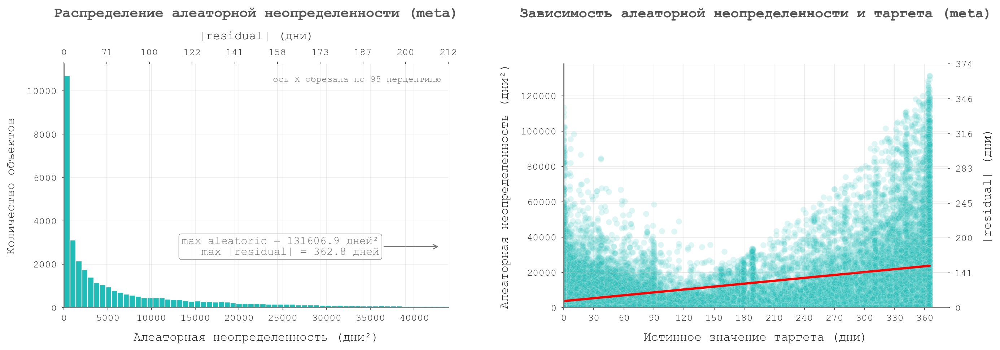

In [106]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

aleatoric = df_uncertainty['aleatoric']
x_limit = df_uncertainty['aleatoric'].quantile(0.95)

# --- histplot: распределение алеаторной неопределенности 

axes[0].hist(aleatoric, bins='auto', edgecolor='white')

max_aleatoric = df_uncertainty['aleatoric'].max()
max_residual = df_uncertainty['abs_error'].max()

axes[0].annotate(
    f"max aleatoric = {max_aleatoric:.1f} дней²\nmax |residual| = {max_residual:.1f} дней",
    xy=(0.98, 0.25), xycoords=axes[0].transAxes,
    xytext=(0.82, 0.25), textcoords=axes[0].transAxes,
    arrowprops=dict(arrowstyle='->', color="#777777", lw=1),
    fontsize=11, color="#777777",
    ha='right', va='center',
    bbox=dict(boxstyle='round,pad=0.25', facecolor='white', 
              edgecolor="#777777", lw=0.5, alpha=0.9),
    )

axes[0].text(0.98, 0.95, "ось X обрезана по 95 перцентилю",
    transform=axes[0].transAxes, ha='right', va='top',
    fontsize=9, color="#777777" )

axes[0].set_title("Распределение алеаторной неопределенности (meta)")
axes[0].set_xlabel("Алеаторная неопределенность (дни²)")
axes[0].set_ylabel("Количество объектов")
axes[0].set_xlim(0, x_limit)

secax = axes[0].twiny()
secax.set_xlim(axes[0].get_xlim())

secax.set_xticks(axes[0].get_xticks())
secax.set_xticklabels(np.sqrt(axes[0].get_xticks()).round(0).astype(int))
secax.set_xlabel("|residual| (дни)")

# --- scatterplot: зависимость ошибки и таргета 

sns.scatterplot(x=y_full, y=aleatoric,
    ax=axes[1], alpha=0.15)

# regplot тренд
sns.regplot(x=y_full, y=aleatoric,
    scatter=False, ax=axes[1], color='red')

axes[1].set_xlabel("Истинное значение таргета (дни)")
axes[1].set_ylabel("Алеаторная неопределенность (дни²)")
axes[1].set_title("Зависимость алеаторной неопределенности и таргета (meta)", pad=47)

axes[1].set_xlim(left=0)
axes[1].set_ylim(bottom=0)
axes[1].set_xticks(np.arange(0, 366, 30))

secay = axes[1].twinx()
secay.set_ylim(axes[1].get_ylim())

secay.set_yticks(axes[1].get_yticks())
secay.set_yticklabels(np.sqrt(axes[1].get_yticks()).round(0).astype(int))
secay.set_ylabel("|residual| (дни)")

plt.tight_layout()
plt.subplots_adjust(wspace=0.3)
plt.show()


1. **histplot**: основная часть значений алеаторной неопределенности сосредоточена около нуля, распределение имеет длинный правый хвост. В пересчете на абсолютную ошибку большинство объектов лежит примерно в диапазоне до 100 дней, но есть редкие случаи с очень большой ошибкой: максимальная |residual| достигает 362.5 дней.

2. **scatterplot**: наибольшая алеаторная неопределенность на больших значениях таргета, особенно около верхней границы 365 дней. На малых значениях таргета также есть заметные ошибки, но наиболее выраженный рост ошибки происходит при больших y_true. Линия тренда показывает, что в среднем ошибка увеличивается вместе с таргетом.

In [107]:
# алеаторные ошибки по моделям:
aleatoric_lr = (df_uncertainty['y_true'] - df_uncertainty['lr']) ** 2
aleatoric_rf = (df_uncertainty['y_true'] - df_uncertainty['rf']) ** 2
aleatoric_lgbm = (df_uncertainty['y_true'] - df_uncertainty['lgbm']) ** 2
aleatoric_cb = (df_uncertainty['y_true'] - df_uncertainty['cb']) ** 2
aleatoric_xgb = (df_uncertainty['y_true'] - df_uncertainty['xgb']) ** 2
aleatoric_meta = (df_uncertainty['y_true'] - df_uncertainty['meta']) ** 2

In [108]:
ae_lr_days = np.sqrt(aleatoric_lr)
ae_rf_days = np.sqrt(aleatoric_rf)
ae_lgbm_days = np.sqrt(aleatoric_lgbm)
ae_cb_days = np.sqrt(aleatoric_cb)
ae_xgb_days = np.sqrt(aleatoric_xgb)
ae_meta_days = np.sqrt(aleatoric_meta)

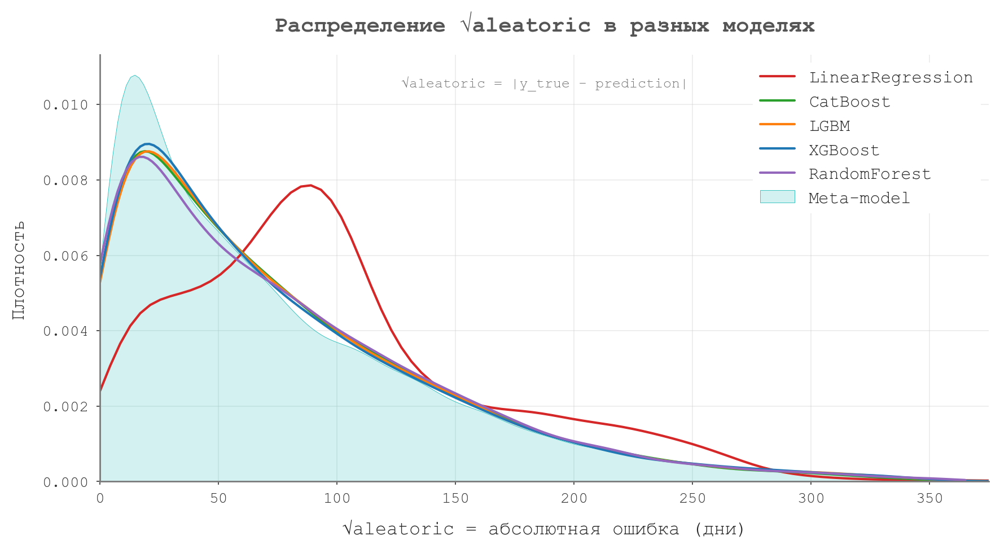

In [ ]:
from scipy.stats import gaussian_kde

# цвета
colors = plt.get_cmap('tab10').colors

# все модели
models = {
    'LinearRegression': (ae_lr_days, colors[3]),
    'CatBoost': (ae_cb_days, colors[2]),
    'LGBM': (ae_lgbm_days, colors[1]),
    'XGBoost': (ae_xgb_days, colors[0]),
    'RandomForest': (ae_rf_days, colors[4]),
}

# ==========================
plt.figure(figsize=(9, 5))
ax = plt.gca()

# основной график
for name, (data, color) in models.items():
    sns.kdeplot(data, bw_adjust=1.5, color=color, cut=0, ax=ax, label=name)

# meta-model
sns.kdeplot(ae_meta_days, color=box, cut=0,
    fill=True, alpha=0.2, linewidth=0.3, ax=ax, label='Meta-model')

ax.text(0.5, 0.95, "√aleatoric = |y_true - prediction|",
    transform=ax.transAxes,
    ha='center', va='top',
    fontsize=9, color="#777777")


# оформление
ax.set_title("Распределение √aleatoric в разных моделях")
ax.set_xlabel("√aleatoric = абсолютная ошибка (дни)")
ax.set_ylabel("Плотность")
ax.set_xlim(0, 375)

ax.legend(loc='upper right', frameon=True, 
          facecolor='white', edgecolor='white', framealpha=1)

ax.grid(which='major', axis='x', alpha=0.3)
ax.grid(which='minor', axis='x', alpha=0.1)


plt.tight_layout()
plt.show()

**Распределения алеаторной неопределенности** показано через распределение √aleatoric, то есть абсолютной ошибки моделей в днях.

Распределения ансамблевых моделей (CatBoost, LGBM, XGBoost, RandomForest) в целом похожи: основная масса ошибок сосредоточена примерно в диапазоне 0-100 дней, при этом есть длинный правый хвост. На большинстве объектов ошибка средняя, но есть редкие сложные случаи с большими отклонениями.

LinearRegression заметно отличается от остальных моделей: распределение смещено вправо, пик находится в области более высоких ошибок, примерно 80-100 дней. Модель систематически ошибается больше, чем остальные.

Meta-model (стекинг) имеет самый высокий пик в области малых ошибок и в целом смещена левее ансамблевых моделей. Стекинг чаще дает меньшую абсолютную ошибку и улучшает качество по сравнению с отдельными базовыми моделями.

Вывод:
распределения ошибок у CatBoost, LGBM, XGBoost и RandomForest близки между собой, LinearRegression заметно хуже, а стекинг дает улучшение и сдвиг к меньшим ошибкам.


#### Зависимость неопределенности от таргета

In [110]:
from scipy.interpolate import make_interp_spline

# функция для построения графика (aleatoric или epistemic)
def plot_models(ax, metric):
    
    for name, (eu, aleatoric, color) in models.items():

        # target — истинные значения
        # value — либо sqrt(aleatoric), либо sqrt(epistemic)
        df = pd.DataFrame({
            'target': y_full,
            'value': np.sqrt(aleatoric) if metric == 'aleatoric' else np.sqrt(eu)
        })

        # бины таргета по 15 дней
        df['bin'] = pd.cut(df['target'], bins=np.arange(0, 384, 15))

        # агрегация таргета по бинам
        df_g = (df.groupby('bin', observed=False).median().sort_values('target'))

        x = df_g['target'].values   # медианное значение таргета внутри бина
        y = df_g['value'].values    # медианная sqrt(aleatoric) или sqrt(epistemic)

        # ---- сглаживание линии ----

        # сортировка 
        idx = np.argsort(x)
        x, y = x[idx], y[idx]

        # сетка по оси X 
        x_new = np.linspace(x.min(), x.max(), 180)

        # степень сплайна:
        k = min(3, len(x) - 1)

        # сглаженная линия
        y_smooth = make_interp_spline(x, y, k=k)(x_new)

        # вывод
        ax.plot(x_new, y_smooth, color=color, alpha=0.9, lw=2, label=name) 


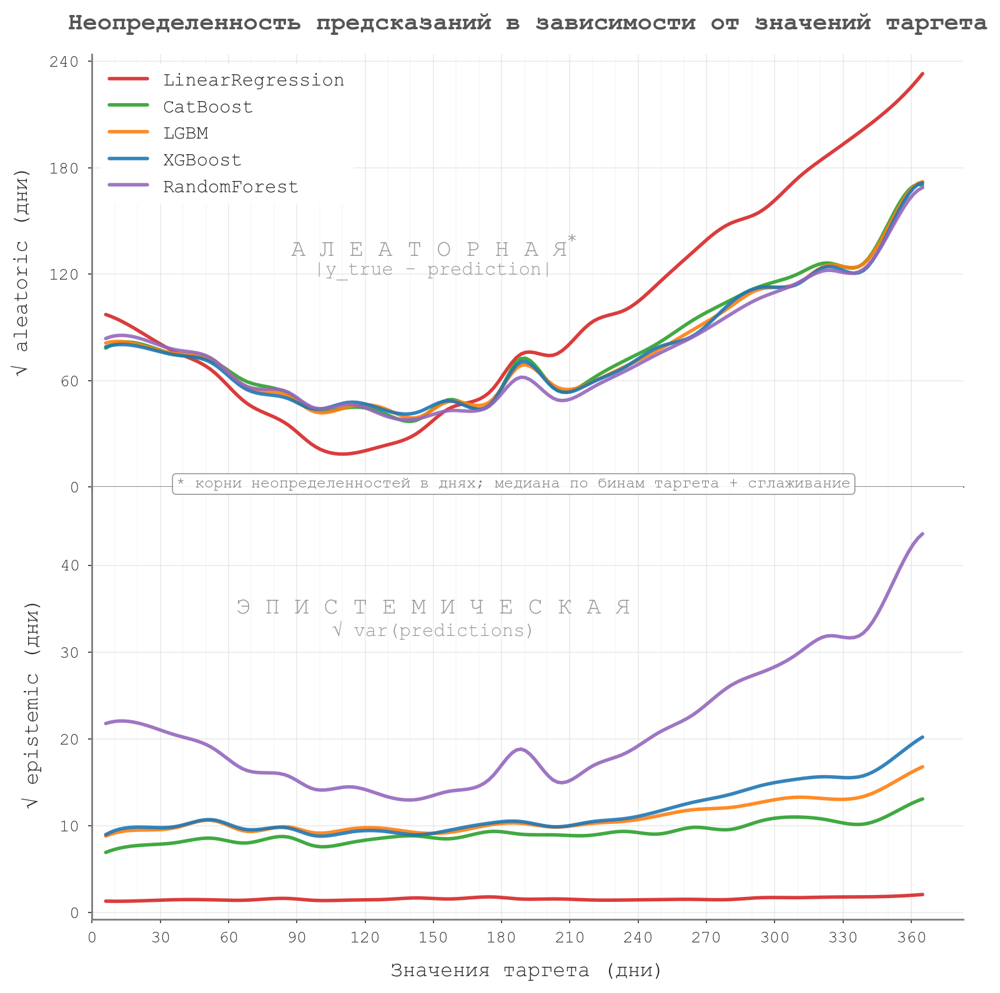

In [111]:
fig, axes = plt.subplots(2, 1, figsize=(9, 9), sharex=True,
                         gridspec_kw={'height_ratios': [1, 1], 'hspace': 0})

models = {
    'LinearRegression': (eu_lr, aleatoric_lr, colors[3]),
    'CatBoost': (eu_cb, aleatoric_cb, colors[2]),
    'LGBM': (eu_lgbm, aleatoric_lgbm, colors[1]),
    'XGBoost': (eu_xgb, aleatoric_xgb, colors[0]),
    'RandomForest': (eu_rf, aleatoric_rf, colors[4]),
}

# --- алеаторная --------------------------------
plot_models(axes[0], 'aleatoric')

axes[0].set_title("Неопределенность предсказаний в зависимости от значений таргета")
axes[0].set_ylabel("√ aleatoric (дни)")

# ось X
axes[0].set_xlim(left=0)
axes[0].set_xticks(np.arange(0, 366, 30))
axes[0].set_xticks(np.arange(0, 366, 10), minor=True)
axes[0].set_yticks(np.arange(0, 260, 60))

axes[0].grid(which='major', axis='x', alpha=0.3)
axes[0].grid(which='minor', axis='x', alpha=0.1)

# название
t_align = 150
t_color="#999999"

axes[0].text(t_align, 135, r'А Л Е А Т О Р Н А Я$^{*}$',
color=t_color, fontsize=14, va='center', ha='center',)
axes[0].text(t_align, 122, '|y_true - prediction|',
color=t_color, fontsize=11, va='center', ha='center',)

# легенда
axes[0].legend(loc='upper left', frameon=True, 
               facecolor='white', edgecolor='white', framealpha=1)

# комментарий
fig.text(
    0.5, 0.49777,
    "* корни неопределенностей в днях; медиана по бинам таргета + сглаживание",
    ha='center', va='center',
    fontsize=9, color="#777777",
    bbox=dict(boxstyle='round,pad=0.25',
        facecolor='white', edgecolor="#777777",
        lw=0.5, alpha=0.9)
)

# --- эпистемическая -----------------------
plot_models(axes[1], 'epistemic')

axes[1].set_xlabel("Значения таргета (дни)")
axes[1].set_ylabel("√ epistemic (дни)")
axes[1].grid(alpha=0.3)

# название
axes[1].text(t_align, 35, 'Э П И С Т Е М И Ч Е С К А Я',
color=t_color, fontsize=14, va='center', ha='center',)
axes[1].text(t_align, 32.5, '√ var(predictions)',
color=t_color, fontsize=11, va='center', ha='center',)

# ось X
axes[1].set_xticks(np.arange(0, 366, 30))
axes[1].set_xticks(np.arange(0, 366, 10), minor=True)
axes[1].grid(which='major', axis='x', alpha=0.3)
axes[1].grid(which='minor', axis='x', alpha=0.1)
axes[1].set_xlim(left=0)
axes[1].set_ylim(top=49)

# plt.tight_layout()
plt.show()

**Алеаторная неопределенность** (ошибка предсказаний):  у CatBoost, LGBM, XGBoost и RandomForest форма кривых очень похожа, ошибка минимальна в средней зоне таргета и резко растет после значений примерно 200. На больших значениях таргета ошибка достигает максимума. LinearRegression выбивается, ее ошибка растет быстрее остальных, особенно после 160-200.

**Эпистемическая неопределенность** (неуверенность модели): у бустингов плавный рост неуверенности с таргетом; у Random Forest - самая высокая неуверенность на всех значениях; у линейной регрессии почти плоская линия. 

При таргете выше 200 ошибка моделей растет быстрее, чем эпистемическая неопределенность. Модели недооценивают риск ошибки на больших значениях таргета. LinearRegression наименее подходящая модель, она дает высокую ошибку при почти нулевой неопределенности. CatBoost, LGBM и XGBoost ведут себя похоже, а RandomForest самая осторожная модель при том же уровне ошибок.

---

### Сумма неопределенностей (эпистемическая + алеаторная)

Общая неопределенность показывает суммарный риск ошибки предсказания. Она складывается из двух компонентов:

- эпистемическая неопределенность — разброс предсказаний моделей, связанный с неуверенностью модели;
- алеаторная неопределенность — ошибка предсказания, связанная с шумом и сложностью данных.

$\text{total\_uncertainty}_i = \text{epistemic}_i + \text{aleatoric}_i$


In [112]:
# суммарная неопределенность для базовых моделей 

total_lr = eu_lr + aleatoric_lr
total_rf = eu_rf + aleatoric_rf
total_lgbm = eu_lgbm + aleatoric_lgbm
total_cb = eu_cb + aleatoric_cb
total_xgb = eu_xgb + aleatoric_xgb

total_lr_days = np.sqrt(total_lr)
total_rf_days = np.sqrt(total_rf)
total_lgbm_days = np.sqrt(total_lgbm)
total_cb_days = np.sqrt(total_cb)
total_xgb_days = np.sqrt(total_xgb)


In [113]:
# суммарная неопределенность для meta-модели

df_uncertainty['total'] = (
    df_uncertainty['epistemic'] + df_uncertainty['aleatoric']
)

df_uncertainty['total_days'] = np.sqrt(
    df_uncertainty['total']
)

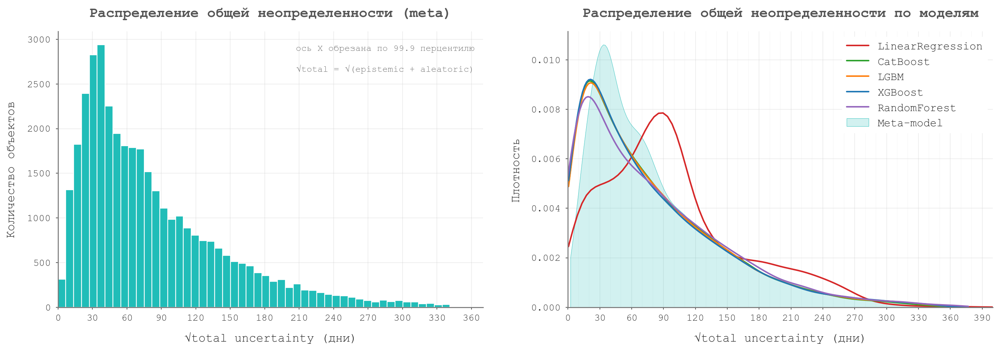

In [114]:
total_meta = df_uncertainty['total']
total_meta_days = df_uncertainty['total_days']

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# histplot
axes[0].hist(total_meta_days, bins=50, edgecolor='white', 
             range=(0, np.quantile(total_meta_days, 0.999)))

axes[0].set_xlabel("√total uncertainty (дни)")
axes[0].set_ylabel("Количество объектов")
axes[0].set_xlim(0, 370)
axes[0].set_title("Распределение общей неопределенности (meta)")

axes[0].set_xticks(np.arange(0, 371, 30))
axes[0].grid(which='major', axis='x', alpha=0.3)

axes[0].text(0.98, 0.95,
    "ось X обрезана по 99.9 перцентилю",
    transform=axes[0].transAxes,
    ha='right', va='top',
    fontsize=9, color="#777777"
)

axes[0].text(0.98, 0.88,
    "√total = √(epistemic + aleatoric)",
    transform=axes[0].transAxes,
    ha='right', va='top',
    fontsize=9,
    color="#777777"
)

# total uncertainty по моделям
models_total = {
    'LinearRegression': (total_lr_days, colors[3]),
    'CatBoost': (total_cb_days, colors[2]),
    'LGBM': (total_lgbm_days, colors[1]),
    'XGBoost': (total_xgb_days, colors[0]),
    'RandomForest': (total_rf_days, colors[4]),
}

for name, (data, color) in models_total.items():
    sns.kdeplot(data, bw_adjust=1.5, cut=0, color=color, ax=axes[1], label=name)

# meta-model
sns.kdeplot(total_meta_days, color=box, cut=0, fill=True,
    alpha=0.2, linewidth=0.3, ax=axes[1], label='Meta-model')

# оформление
axes[1].set_title("Распределение общей неопределенности по моделям")
axes[1].set_xlabel("√total uncertainty (дни)")
axes[1].set_ylabel("Плотность")
axes[1].set_xlim(0, 400)

axes[1].legend(loc='upper right', frameon=True, 
               facecolor='white', edgecolor='white', framealpha=1)

# тики
axes[1].set_xticks(np.arange(0, 400, 30))
axes[1].set_xticks(np.arange(0, 400, 10), minor=True)

axes[1].grid(which='major', axis='x', alpha=0.3)
axes[1].grid(which='minor', axis='x', alpha=0.1)

plt.tight_layout()
plt.subplots_adjust(wspace=0.2)
plt.show()


1. **histplot**: основная часть значений общей неопределенности сосредоточена в диапазоне ~0–150, есть длинный правый хвост до 300+ на видимой части графика. Большинство объектов имеют низкую или среднюю суммарную неопределенность, но встречаются редкие случаи с очень высокой.

2. **kde**: все ансамблевые модели (CatBoost, LGBM, XGBoost) ведут себя очень похоже, их распределения почти накладываются.\ 
Распределение Random Forest немного ниже в пике и чуть тяжелее в правой части.\
Linear Regression дает более высокую суммарную неопределенность, хуже справляется с предсказаниями.\
Мета-модель: более высокий пик в области малых значений.

Примечание по заданию:\
Связь общей неопределенности с фактической ошибкой строить неинформативно, потому что aleatoric = residual² уже входит в total_uncertainty. Зависимость будет частично задана самой формулой.

---

### Метрики, алеаторной, эпистемической и общей неопределенности

In [115]:
models_uncertainty = {
    'LinearRegression': (eu_lr, aleatoric_lr),
    'CatBoost': (eu_cb, aleatoric_cb),
    'LGBM': (eu_lgbm, aleatoric_lgbm),
    'XGBoost': (eu_xgb, aleatoric_xgb),
    'RandomForest': (eu_rf, aleatoric_rf),
}

In [116]:
summary = []

for name, (eu, aleatoric) in models_uncertainty.items():
    total = eu + aleatoric
    
    summary.append({
        'model': name,
        
        # sqrt(aleatoric)
        'ae_median_days': np.median(np.sqrt(aleatoric)),
        'ae_p90_days': np.quantile(np.sqrt(aleatoric), 0.9),
        
        # sqrt(epistemic)
        'eu_median_days': np.median(np.sqrt(eu)),
        'eu_p90_days': np.quantile(np.sqrt(eu), 0.9),
        
        # sqrt(total)
        'total_median_days': np.median(np.sqrt(total)),
        'total_p90_days': np.quantile(np.sqrt(total), 0.9),
    })

# meta 
summary.append({
    'model': 'Meta-model',
    'ae_median_days': np.median(np.sqrt(df_uncertainty['aleatoric'])),
    'ae_p90_days': np.quantile(np.sqrt(df_uncertainty['aleatoric']), 0.9),
    'eu_median_days': np.median(np.sqrt(df_uncertainty['epistemic'])),
    'eu_p90_days': np.quantile(np.sqrt(df_uncertainty['epistemic']), 0.9),
    'total_median_days': np.median(df_uncertainty['total_days']),
    'total_p90_days': np.quantile(df_uncertainty['total_days'], 0.9),
})

df_summary = pd.DataFrame(summary).set_index('model').round(2)

display(df_summary.reset_index())


,model,ae_median_days,ae_p90_days,eu_median_days,eu_p90_days,total_median_days,total_p90_days
0,LinearRegression,87.29,198.56,1.50,3.54,87.33,198.57
1,CatBoost,58.40,168.61,7.64,17.12,59.23,169.32
2,LGBM,58.39,169.15,8.97,20.10,59.29,170.40
3,XGBoost,56.76,169.55,9.01,23.99,57.68,171.58
4,RandomForest,59.12,170.70,16.62,45.57,61.54,176.52
5,Meta-model,54.72,168.09,20.68,41.17,64.28,170.52


**Метрики неопределенности по моделям**

1. **Алеаторная неопределенность**:\
Мета-модель улучшает предсказания отдельных моделей: ее медианная ошибка минимальна среди всех моделей – 54.61 дня.\
Бустинговые модели дают близкие оценки и ошибаются по медиане примерно на 57-58 дней.

2. **Эпистемическая неопределенность**:\
Самая уверенная в своих предсказаниях — линейная регрессия: ее медианная эпистемическая неопределенность составляет 1.50 дня. При этом ошибка у LinearRegression самая высокая.\
Среди бустинговых моделей наиболее уверена в предсказаниях CatBoost (7.78), затем LGBM (8.97) и XGBoost (9.01). RandomForest сомневается больше (16.62). У мета-модели медианная эпистемическая неопределенность самая высокая (20.63 дня), так как она отражает несогласие базовых моделей между собой.

3. **Суммарная медианная неопределенность** мета-модели равна 64.36 дня. Она выше, чем у базовых бустинговых моделей (57-59), но ниже линейной регрессии (87.33).\
При оценке 90-го перцентиля мета-модель дает значение 170.56 дня, близко к отдельным бустинговым моделям.  

\
**Ансамблевые бустинговые модели** (CatBoost, LGBM, XGBoost) имеют наилучший баланс между ошибкой и неопределенностью.

**Linear Regression** дает уверенные, но некорректные предсказания.

**Random Forest** имеет высокую эпистемическую неопределенность, его предсказания менее стабильны.

**Мета-модель** имеет самую низкую алеаторную ошибку по сравнению с отдельными моделями, но более высокую медианную эпистемическую неопределенность. В результате суммарная медианная неопределенность мета-модели оказывается выше, чем у лучших базовых моделей.


---

### **Вывод**
- Основное ограничение качества моделей связано не столько с их архитектурой, сколько со структурой данных: дисбалансом таргета, большим количеством нулевых значений. В таких условиях модели склонны смещать предсказания к среднему, растут ошибки на сложных наблюдениях.
- В качестве варианта решения можно рассмотреть подход в два этапа: сначала классифицировать объекты с нулевым таргетом, затем отдельно моделировать предсказания для остальных объектов.
- Также можно протестировать увеличение количества признаков, например извлеченных из текста описания листингов – влияет ли длина описания, структура текста, наличие определенных ключевых слов на таргет.
- Объекты с высокой суммарной неопределенностью стоит проанализировать отдельно.